<div class="alert alert-block alert-info">
<h1> Analyse MTBLS17 peak table</h1>
<h3>Link to dataset in Metabolights <a href="https://www.ebi.ac.uk/metabolights/MTBLS17/">here</a>.</h3>
</div>

---
# Table of contents
- [0 - Import modules](#0---Import-modules)
- [0 - Import data](#0---Import-data)
- [1 - Preprocess data](#1---Preprocess-data)
  - [a - Transform data to adapt with input requirements](#a---Transform-data-to-adapt-with-input-requirements)
- [2 - Explore data](#2---Explore-data)
  - [a - Feature types](#a---Feature-types)
  - [b - Missing values exploration](#b---Missing-values-exploration)
  - [c - Correlation between features](#c---Correlation-between-features)
  - [d - Remove strongly correlated features (to potentially avoid issues during further analysis)](#d---Remove-strongly-correlated-features-(to-potentially-avoid-issues-during-further-analysis))
  - [e - PCA](#e---PCA)
  - [f - Target visualisation](#f---Target-visualisation)
  - [g - Feature visualisation](#g---Feature-visualisation)
- [3 - Impute missing values](#3---Impute-missing-values)
  - [a - Impute intensities with 1's](#a---Impute-intensities-with-1's)
  - [b - Impute intensities with half minimum value in features](#b---Impute-intensities-with-half-minimum-value-in-features)
- [4 - Transformations](#4---Transformations)
  - [a - log transformation](#a---log-transformation)
  - [b - Standard scale intensities](#b---Standard-scale-intensities)
- [5 - Dimensionality reduction](#5---Dimensionality-reduction)
  - [a - PCA then t-SNE](#a---PCA-then-t-SNE)
  - [b - Feature selection keeping all features with ANOVA pvalue $\lt \alpha \hspace{0.39cm}$](#b---Feature-selection-keeping-all-features-with-ANOVA-pvalue-$\lt-\alpha-\hspace{0.39cm}$)
  - [c - Feature selection keeping a specific number of features](#c---Feature-selection-keeping-a-specific-number-of-features)
- [6 - Classification](#6---Classification)
  - [a - Launch pipeline with differently preprocessed dataframes](#a---Launch-pipeline-with-differently-preprocessed-dataframes)
- [7 - Clustering](#7---Clustering)
  - [a - Kmeans](#a---Kmeans)
  - [b - Affinity propagation](#b---Affinity-propagation)
  - [c - Hierarchical clustering](#c---Hierarchical-clustering)
---

# 0 - Import modules

In [75]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import random
import cimcb_lite as cb

In [2]:
import re
pwd = ! pwd
pwd = re.sub('notebooks/', '', pwd[0])
pwd = '/'.join(pwd.split('/')[:-1]) + '/'
print(f'Working directory : {pwd}')

python_version = ! python --version
print(f'Python version : {python_version[0]}')

Working directory : /home/jovyan/work/
Python version : Python 3.10.4


In [3]:
# Tune the visual settings for figures in seaborn
sns.set_context(
    "notebook", font_scale=1.2, rc={"figure.figsize": (15,8), "axes.titlesize": 15}
)

from matplotlib import rcParams

rcParams["figure.figsize"] = 15, 8

sns.set_theme(style="darkgrid")

In [4]:
import sys
sys.path.append(pwd + 'bin/')

# 0 - Import data

In [5]:
peakTable_MTBLS17_init = pd.read_excel(pwd + 'data/MTBLS17/Peaklist_EXP1_POS.xlsx', sheet_name='US_EXP1_POS_Annotated_Abbr')
print(f'Peak table shape : {peakTable_MTBLS17_init.shape}')
peakTable_MTBLS17_init.head()

Peak table shape : (1586, 388)


,mz,mono_mz,rt,FC,TT_pv,TT_qv,WX_pv,WX_qv,Exp1_CRR_1a_POS,Exp1_CRR_1b_POS,...,Exp1_HCC_59a_POS,Exp1_HCC_59b_POS,Exp1_HCC_60a_POS,Exp1_HCC_60b_POS,Exp1_HCC_63a_POS,Exp1_HCC_63b_POS,Exp1_HCC_64a_POS,Exp1_HCC_64b_POS,isotopes,adduct
0,69.034193,69.034193,245.927310,1.064983,0.361288,0.414002,0.418035,0.440384,230.127798,587.927618,...,713.427477,797.486999,944.502223,1008.902996,989.869316,1050.722511,1063.436804,1149.045224,NaN,NaN
1,69.034752,69.034752,139.172875,1.444227,0.016183,0.091260,0.072598,0.199058,118.194026,129.710850,...,90.783984,77.323598,33.814223,30.604424,42.869602,30.771758,389.046294,424.640566,NaN,NaN
2,69.070384,69.070384,33.994059,1.215627,0.007724,0.078745,0.000686,0.024863,757.591222,594.600666,...,298.010732,255.891087,282.365009,246.467121,171.359314,161.726294,323.123227,288.725470,NaN,NaN
3,69.070545,69.070545,373.031466,1.144033,0.407307,0.442863,0.234142,0.355057,107.927970,145.488720,...,220.801553,297.617438,606.661381,785.677459,392.755907,410.149582,427.651740,376.692099,NaN,NaN
4,70.065640,70.065640,22.760499,-1.026797,0.671203,0.543876,0.724250,0.565184,950.757846,896.401881,...,360.511751,356.275541,270.565775,277.458326,209.780709,236.145254,201.404361,210.853556,NaN,NaN


In [6]:
metadata = pd.read_csv(pwd + 'data/MTBLS17/s_live_mtbls17.txt', sep='\t')
print(f'Metadata shape : {metadata.shape}')
metadata.head()

Metadata shape : (1050, 18)


,Source Name,Characteristics[Organism],Term Source REF,Term Accession Number,Characteristics[Organism part],Term Source REF.1,Term Accession Number.1,Protocol REF,Sample Name,Factor Value[Experiment],Term Source REF.2,Term Accession Number.2,Factor Value[Disease],Term Source REF.3,Term Accession Number.3,Factor Value[Injection],Term Source REF.4,Term Accession Number.4
0,Human blood serum,Homo sapiens,NCBITAXON,http://purl.bioontology.org/ontology/NCBITAXON...,blood serum,BTO,http://purl.obolibrary.org/obo/BTO_0000133,Sample collection,Exp1_CRR_1a_NEG,Exp1,NaN,NaN,CRR,NaN,NaN,Inj1,NaN,NaN
1,Human blood serum,Homo sapiens,NCBITAXON,http://purl.bioontology.org/ontology/NCBITAXON...,blood serum,BTO,http://purl.obolibrary.org/obo/BTO_0000133,Sample collection,Exp1_CRR_1b_NEG,Exp1,NaN,NaN,CRR,NaN,NaN,Inj2,NaN,NaN
2,Human blood serum,Homo sapiens,NCBITAXON,http://purl.bioontology.org/ontology/NCBITAXON...,blood serum,BTO,http://purl.obolibrary.org/obo/BTO_0000133,Sample collection,Exp1_CRR_3a_NEG,Exp1,NaN,NaN,CRR,NaN,NaN,Inj1,NaN,NaN
3,Human blood serum,Homo sapiens,NCBITAXON,http://purl.bioontology.org/ontology/NCBITAXON...,blood serum,BTO,http://purl.obolibrary.org/obo/BTO_0000133,Sample collection,Exp1_CRR_3b_NEG,Exp1,NaN,NaN,CRR,NaN,NaN,Inj2,NaN,NaN
4,Human blood serum,Homo sapiens,NCBITAXON,http://purl.bioontology.org/ontology/NCBITAXON...,blood serum,BTO,http://purl.obolibrary.org/obo/BTO_0000133,Sample collection,Exp1_CRR_4a_NEG,Exp1,NaN,NaN,CRR,NaN,NaN,Inj1,NaN,NaN


### Below we will keep onky useful metadata

# 1 - Preprocess data

In [7]:
from explore_data_functions import *

## a - Transform data to adapt with input requirements

In [8]:
peakTable_MTBLS17 = peakTable_MTBLS17_init.copy()
peakTable_MTBLS17 = peakTable_MTBLS17.loc[:, 'Exp1_CRR_1a_POS':]
peakTable_MTBLS17 = peakTable_MTBLS17.drop(['isotopes', 'adduct'], axis=1)
peakTable_MTBLS17.head()

,Exp1_CRR_1a_POS,Exp1_CRR_1b_POS,Exp1_CRR_3a_POS,Exp1_CRR_3b_POS,Exp1_CRR_4a_POS,Exp1_CRR_4b_POS,Exp1_CRR_5a_POS,Exp1_CRR_5b_POS,Exp1_CRR_6a_POS,Exp1_CRR_6b_POS,...,Exp1_HCC_58a_POS,Exp1_HCC_58b_POS,Exp1_HCC_59a_POS,Exp1_HCC_59b_POS,Exp1_HCC_60a_POS,Exp1_HCC_60b_POS,Exp1_HCC_63a_POS,Exp1_HCC_63b_POS,Exp1_HCC_64a_POS,Exp1_HCC_64b_POS
0,230.127798,587.927618,300.579088,568.440320,237.746731,460.294192,440.768045,740.698257,612.552420,1133.597320,...,871.093823,1010.693479,713.427477,797.486999,944.502223,1008.902996,989.869316,1050.722511,1063.436804,1149.045224
1,118.194026,129.710850,212.674262,222.858966,124.304083,136.387626,138.485911,161.454543,257.832954,270.554464,...,29.157877,50.976520,90.783984,77.323598,33.814223,30.604424,42.869602,30.771758,389.046294,424.640566
2,757.591222,594.600666,658.022293,580.603252,645.234904,561.511359,461.754859,417.581034,731.752527,562.375061,...,174.268984,128.793853,298.010732,255.891087,282.365009,246.467121,171.359314,161.726294,323.123227,288.725470
3,107.927970,145.488720,98.527020,114.068949,47.450318,81.684234,75.641921,74.463995,112.473876,185.631654,...,311.326136,384.622123,220.801553,297.617438,606.661381,785.677459,392.755907,410.149582,427.651740,376.692099
4,950.757846,896.401881,646.353708,622.684905,731.368097,722.464761,1194.746673,1157.661719,843.330026,860.639631,...,300.492187,256.624484,360.511751,356.275541,270.565775,277.458326,209.780709,236.145254,201.404361,210.853556


In [9]:
peakTable_MTBLS17.insert(0, '', peakTable_MTBLS17_init['mz'].astype(str) + '@' + peakTable_MTBLS17_init['rt'].astype(str))
peakTable_MTBLS17 = peakTable_MTBLS17.transpose()
peakTable_MTBLS17.columns = peakTable_MTBLS17.iloc[0, :]
peakTable_MTBLS17 = peakTable_MTBLS17.drop(peakTable_MTBLS17.index[0], axis=0)
peakTable_MTBLS17 = peakTable_MTBLS17.reset_index()
peakTable_MTBLS17 = peakTable_MTBLS17.rename(columns={'index': 'Sample Name'})
peakTable_MTBLS17.index = range(peakTable_MTBLS17.shape[0])
peakTable_MTBLS17

,Sample Name,69.034193421312@245.927309952246,69.0347519118582@139.172874889953,69.0703839837015@33.9940592171752,69.0705452827662@373.031465819143,70.0656402237219@22.7604988324661,71.085449630006@379.222418617272,71.0860210463123@415.343642215146,72.0810846503853@23.7091295964681,72.0806908589304@130.850159427121,...,842.795116334759@134.243350128277,842.995196023264@134.17823047015,843.195277057917@134.085230424832,846.444435650557@246.201206619627,847.448174639483@246.199506838937,848.38745497379@245.903140535829,848.885621429239@245.902303453468,849.388345280949@245.887139929679,849.889131681996@245.885868301917,849.928235681684@126.237312302097
0,Exp1_CRR_1a_POS,230.127798,118.194026,757.591222,107.92797,950.757846,28.594198,46.730671,1762.311873,110.714424,...,118.231221,111.8675,81.669004,120.860379,63.647664,26.854367,21.924561,6.821398,2.15699,67.549779
1,Exp1_CRR_1b_POS,587.927618,129.71085,594.600666,145.48872,896.401881,27.842101,73.665886,1551.050083,92.467096,...,50.584648,52.091682,27.073475,404.589261,223.520876,442.007981,402.357357,281.384643,128.797298,47.65169
2,Exp1_CRR_3a_POS,300.579088,212.674262,658.022293,98.52702,646.353708,7.84453,214.083198,1574.624653,453.30163,...,1112.409878,975.970006,680.246087,53.616534,37.061376,74.074524,84.825422,48.47349,27.935645,80.91451
3,Exp1_CRR_3b_POS,568.44032,222.858966,580.603252,114.068949,622.684905,15.184581,93.77348,1627.352106,386.058506,...,728.723647,634.409467,421.469118,197.20996,170.212911,375.213998,360.015568,234.676324,82.68435,76.567716
4,Exp1_CRR_4a_POS,237.746731,124.304083,645.234904,47.450318,731.368097,13.99582,86.307903,2185.432179,489.903128,...,831.834366,740.936243,456.295758,39.32849,26.711362,58.673974,89.294382,44.567909,11.712702,100.32646
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
373,Exp1_HCC_60b_POS,1008.902996,30.604424,246.467121,785.677459,277.458326,428.994807,513.5764,435.752104,122.025016,...,13.108141,17.362689,12.872893,270.601235,129.342502,711.25957,681.918379,415.284426,180.770813,54.829076
374,Exp1_HCC_63a_POS,989.869316,42.869602,171.359314,392.755907,209.780709,515.953289,454.149754,251.946306,173.765368,...,17.363786,7.213925,5.771138,313.177025,126.714662,871.67816,852.241868,532.747944,223.508213,70.677193
375,Exp1_HCC_63b_POS,1050.722511,30.771758,161.726294,410.149582,236.145254,553.329039,509.207554,232.200898,158.721836,...,17.349835,22.410207,15.904014,306.347355,182.640853,847.550776,903.968504,561.767012,263.886891,53.45313
376,Exp1_HCC_64a_POS,1063.436804,389.046294,323.123227,427.65174,201.404361,323.780079,326.438945,733.334184,341.597362,...,398.535328,313.529325,178.762242,172.122525,87.828888,643.123226,663.230258,399.842543,143.443414,130.069887


In [10]:
metadata_subset = metadata[metadata['Sample Name'].isin(peakTable_MTBLS17['Sample Name'])]
print(f'Metadata shape : {metadata_subset.shape}')
metadata_subset.head()

Metadata shape : (378, 18)


,Source Name,Characteristics[Organism],Term Source REF,Term Accession Number,Characteristics[Organism part],Term Source REF.1,Term Accession Number.1,Protocol REF,Sample Name,Factor Value[Experiment],Term Source REF.2,Term Accession Number.2,Factor Value[Disease],Term Source REF.3,Term Accession Number.3,Factor Value[Injection],Term Source REF.4,Term Accession Number.4
526,Human blood serum,Homo sapiens,NCBITAXON,http://purl.bioontology.org/ontology/NCBITAXON...,blood serum,BTO,http://purl.obolibrary.org/obo/BTO_0000133,Sample collection,Exp1_CRR_1a_POS,Exp1,NaN,NaN,CRR,NaN,NaN,Inj1,NaN,NaN
527,Human blood serum,Homo sapiens,NCBITAXON,http://purl.bioontology.org/ontology/NCBITAXON...,blood serum,BTO,http://purl.obolibrary.org/obo/BTO_0000133,Sample collection,Exp1_CRR_1b_POS,Exp1,NaN,NaN,CRR,NaN,NaN,Inj2,NaN,NaN
528,Human blood serum,Homo sapiens,NCBITAXON,http://purl.bioontology.org/ontology/NCBITAXON...,blood serum,BTO,http://purl.obolibrary.org/obo/BTO_0000133,Sample collection,Exp1_CRR_3a_POS,Exp1,NaN,NaN,CRR,NaN,NaN,Inj1,NaN,NaN
529,Human blood serum,Homo sapiens,NCBITAXON,http://purl.bioontology.org/ontology/NCBITAXON...,blood serum,BTO,http://purl.obolibrary.org/obo/BTO_0000133,Sample collection,Exp1_CRR_3b_POS,Exp1,NaN,NaN,CRR,NaN,NaN,Inj2,NaN,NaN
530,Human blood serum,Homo sapiens,NCBITAXON,http://purl.bioontology.org/ontology/NCBITAXON...,blood serum,BTO,http://purl.obolibrary.org/obo/BTO_0000133,Sample collection,Exp1_CRR_4a_POS,Exp1,NaN,NaN,CRR,NaN,NaN,Inj1,NaN,NaN


In [11]:
peakTable = pd.merge(left=metadata_subset[['Sample Name', 'Factor Value[Disease]']].rename(columns={'Factor Value[Disease]': 'Disease'}),
                     right=peakTable_MTBLS17,
                     on='Sample Name')
peakTable

,Sample Name,Disease,69.034193421312@245.927309952246,69.0347519118582@139.172874889953,69.0703839837015@33.9940592171752,69.0705452827662@373.031465819143,70.0656402237219@22.7604988324661,71.085449630006@379.222418617272,71.0860210463123@415.343642215146,72.0810846503853@23.7091295964681,...,842.795116334759@134.243350128277,842.995196023264@134.17823047015,843.195277057917@134.085230424832,846.444435650557@246.201206619627,847.448174639483@246.199506838937,848.38745497379@245.903140535829,848.885621429239@245.902303453468,849.388345280949@245.887139929679,849.889131681996@245.885868301917,849.928235681684@126.237312302097
0,Exp1_CRR_1a_POS,CRR,230.127798,118.194026,757.591222,107.92797,950.757846,28.594198,46.730671,1762.311873,...,118.231221,111.8675,81.669004,120.860379,63.647664,26.854367,21.924561,6.821398,2.15699,67.549779
1,Exp1_CRR_1b_POS,CRR,587.927618,129.71085,594.600666,145.48872,896.401881,27.842101,73.665886,1551.050083,...,50.584648,52.091682,27.073475,404.589261,223.520876,442.007981,402.357357,281.384643,128.797298,47.65169
2,Exp1_CRR_3a_POS,CRR,300.579088,212.674262,658.022293,98.52702,646.353708,7.84453,214.083198,1574.624653,...,1112.409878,975.970006,680.246087,53.616534,37.061376,74.074524,84.825422,48.47349,27.935645,80.91451
3,Exp1_CRR_3b_POS,CRR,568.44032,222.858966,580.603252,114.068949,622.684905,15.184581,93.77348,1627.352106,...,728.723647,634.409467,421.469118,197.20996,170.212911,375.213998,360.015568,234.676324,82.68435,76.567716
4,Exp1_CRR_4a_POS,CRR,237.746731,124.304083,645.234904,47.450318,731.368097,13.99582,86.307903,2185.432179,...,831.834366,740.936243,456.295758,39.32849,26.711362,58.673974,89.294382,44.567909,11.712702,100.32646
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
373,Exp1_HCC_60b_POS,HCC,1008.902996,30.604424,246.467121,785.677459,277.458326,428.994807,513.5764,435.752104,...,13.108141,17.362689,12.872893,270.601235,129.342502,711.25957,681.918379,415.284426,180.770813,54.829076
374,Exp1_HCC_63a_POS,HCC,989.869316,42.869602,171.359314,392.755907,209.780709,515.953289,454.149754,251.946306,...,17.363786,7.213925,5.771138,313.177025,126.714662,871.67816,852.241868,532.747944,223.508213,70.677193
375,Exp1_HCC_63b_POS,HCC,1050.722511,30.771758,161.726294,410.149582,236.145254,553.329039,509.207554,232.200898,...,17.349835,22.410207,15.904014,306.347355,182.640853,847.550776,903.968504,561.767012,263.886891,53.45313
376,Exp1_HCC_64a_POS,HCC,1063.436804,389.046294,323.123227,427.65174,201.404361,323.780079,326.438945,733.334184,...,398.535328,313.529325,178.762242,172.122525,87.828888,643.123226,663.230258,399.842543,143.443414,130.069887


In [12]:
peakTable.to_csv(pwd + 'data/MTBLS17/processed_peakTable.csv', index=False, header=True)

### Separate intensities (in dataframe <code>X</code>) and metadata (in dataframe <code>metadata</code>)

In [13]:
X = peakTable.iloc[:, 2:]
X

,69.034193421312@245.927309952246,69.0347519118582@139.172874889953,69.0703839837015@33.9940592171752,69.0705452827662@373.031465819143,70.0656402237219@22.7604988324661,71.085449630006@379.222418617272,71.0860210463123@415.343642215146,72.0810846503853@23.7091295964681,72.0806908589304@130.850159427121,79.0216519285783@23.9698168449792,...,842.795116334759@134.243350128277,842.995196023264@134.17823047015,843.195277057917@134.085230424832,846.444435650557@246.201206619627,847.448174639483@246.199506838937,848.38745497379@245.903140535829,848.885621429239@245.902303453468,849.388345280949@245.887139929679,849.889131681996@245.885868301917,849.928235681684@126.237312302097
0,230.127798,118.194026,757.591222,107.92797,950.757846,28.594198,46.730671,1762.311873,110.714424,1489.485358,...,118.231221,111.8675,81.669004,120.860379,63.647664,26.854367,21.924561,6.821398,2.15699,67.549779
1,587.927618,129.71085,594.600666,145.48872,896.401881,27.842101,73.665886,1551.050083,92.467096,1443.736018,...,50.584648,52.091682,27.073475,404.589261,223.520876,442.007981,402.357357,281.384643,128.797298,47.65169
2,300.579088,212.674262,658.022293,98.52702,646.353708,7.84453,214.083198,1574.624653,453.30163,1473.123244,...,1112.409878,975.970006,680.246087,53.616534,37.061376,74.074524,84.825422,48.47349,27.935645,80.91451
3,568.44032,222.858966,580.603252,114.068949,622.684905,15.184581,93.77348,1627.352106,386.058506,1522.18022,...,728.723647,634.409467,421.469118,197.20996,170.212911,375.213998,360.015568,234.676324,82.68435,76.567716
4,237.746731,124.304083,645.234904,47.450318,731.368097,13.99582,86.307903,2185.432179,489.903128,456.882836,...,831.834366,740.936243,456.295758,39.32849,26.711362,58.673974,89.294382,44.567909,11.712702,100.32646
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
373,1008.902996,30.604424,246.467121,785.677459,277.458326,428.994807,513.5764,435.752104,122.025016,73.071403,...,13.108141,17.362689,12.872893,270.601235,129.342502,711.25957,681.918379,415.284426,180.770813,54.829076
374,989.869316,42.869602,171.359314,392.755907,209.780709,515.953289,454.149754,251.946306,173.765368,53.586484,...,17.363786,7.213925,5.771138,313.177025,126.714662,871.67816,852.241868,532.747944,223.508213,70.677193
375,1050.722511,30.771758,161.726294,410.149582,236.145254,553.329039,509.207554,232.200898,158.721836,55.677307,...,17.349835,22.410207,15.904014,306.347355,182.640853,847.550776,903.968504,561.767012,263.886891,53.45313
376,1063.436804,389.046294,323.123227,427.65174,201.404361,323.780079,326.438945,733.334184,341.597362,60.501829,...,398.535328,313.529325,178.762242,172.122525,87.828888,643.123226,663.230258,399.842543,143.443414,130.069887


In [14]:
metadata = peakTable.drop(X.columns, axis=1)
metadata

,Sample Name,Disease
0,Exp1_CRR_1a_POS,CRR
1,Exp1_CRR_1b_POS,CRR
2,Exp1_CRR_3a_POS,CRR
3,Exp1_CRR_3b_POS,CRR
4,Exp1_CRR_4a_POS,CRR
...,...,...
373,Exp1_HCC_60b_POS,HCC
374,Exp1_HCC_63a_POS,HCC
375,Exp1_HCC_63b_POS,HCC
376,Exp1_HCC_64a_POS,HCC


In [15]:
target = metadata['Disease']

# 2 - Explore data

## a - Feature types

######################################################################################################################################################
Data types : 
object    1588
dtype: int64



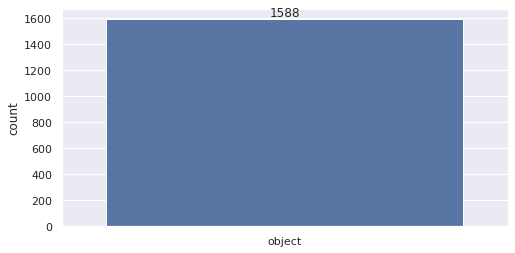

######################################################################################################################################################


In [16]:
plot_feature_types(peakTable)

### For further analysis, we prefer peak table intensites as float

In [17]:
peakTable[peakTable.columns[2:]] = peakTable[peakTable.columns[2:]].apply(pd.to_numeric, errors='coerce', axis=1)
peakTable

,Sample Name,Disease,69.034193421312@245.927309952246,69.0347519118582@139.172874889953,69.0703839837015@33.9940592171752,69.0705452827662@373.031465819143,70.0656402237219@22.7604988324661,71.085449630006@379.222418617272,71.0860210463123@415.343642215146,72.0810846503853@23.7091295964681,...,842.795116334759@134.243350128277,842.995196023264@134.17823047015,843.195277057917@134.085230424832,846.444435650557@246.201206619627,847.448174639483@246.199506838937,848.38745497379@245.903140535829,848.885621429239@245.902303453468,849.388345280949@245.887139929679,849.889131681996@245.885868301917,849.928235681684@126.237312302097
0,Exp1_CRR_1a_POS,CRR,230.127798,118.194026,757.591222,107.927970,950.757846,28.594198,46.730671,1762.311873,...,118.231221,111.867500,81.669004,120.860379,63.647664,26.854367,21.924561,6.821398,2.156990,67.549779
1,Exp1_CRR_1b_POS,CRR,587.927618,129.710850,594.600666,145.488720,896.401881,27.842101,73.665886,1551.050083,...,50.584648,52.091682,27.073475,404.589261,223.520876,442.007981,402.357357,281.384643,128.797298,47.651690
2,Exp1_CRR_3a_POS,CRR,300.579088,212.674262,658.022293,98.527020,646.353708,7.844530,214.083198,1574.624653,...,1112.409878,975.970006,680.246087,53.616534,37.061376,74.074524,84.825422,48.473490,27.935645,80.914510
3,Exp1_CRR_3b_POS,CRR,568.440320,222.858966,580.603252,114.068949,622.684905,15.184581,93.773480,1627.352106,...,728.723647,634.409467,421.469118,197.209960,170.212911,375.213998,360.015568,234.676324,82.684350,76.567716
4,Exp1_CRR_4a_POS,CRR,237.746731,124.304083,645.234904,47.450318,731.368097,13.995820,86.307903,2185.432179,...,831.834366,740.936243,456.295758,39.328490,26.711362,58.673974,89.294382,44.567909,11.712702,100.326460
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
373,Exp1_HCC_60b_POS,HCC,1008.902996,30.604424,246.467121,785.677459,277.458326,428.994807,513.576400,435.752104,...,13.108141,17.362689,12.872893,270.601235,129.342502,711.259570,681.918379,415.284426,180.770813,54.829076
374,Exp1_HCC_63a_POS,HCC,989.869316,42.869602,171.359314,392.755907,209.780709,515.953289,454.149754,251.946306,...,17.363786,7.213925,5.771138,313.177025,126.714662,871.678160,852.241868,532.747944,223.508213,70.677193
375,Exp1_HCC_63b_POS,HCC,1050.722511,30.771758,161.726294,410.149582,236.145254,553.329039,509.207554,232.200898,...,17.349835,22.410207,15.904014,306.347355,182.640853,847.550776,903.968504,561.767012,263.886891,53.453130
376,Exp1_HCC_64a_POS,HCC,1063.436804,389.046294,323.123227,427.651740,201.404361,323.780079,326.438945,733.334184,...,398.535328,313.529325,178.762242,172.122525,87.828888,643.123226,663.230258,399.842543,143.443414,130.069887


######################################################################################################################################################
Data types : 
float64    1586
object        2
dtype: int64



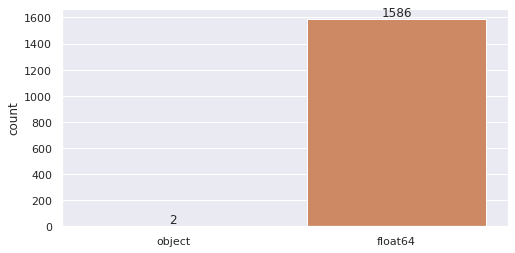

######################################################################################################################################################


In [18]:
plot_feature_types(peakTable)

### Re-subset X to have numerical values instead of object

In [19]:
X = peakTable.iloc[:, 2:]
X

,69.034193421312@245.927309952246,69.0347519118582@139.172874889953,69.0703839837015@33.9940592171752,69.0705452827662@373.031465819143,70.0656402237219@22.7604988324661,71.085449630006@379.222418617272,71.0860210463123@415.343642215146,72.0810846503853@23.7091295964681,72.0806908589304@130.850159427121,79.0216519285783@23.9698168449792,...,842.795116334759@134.243350128277,842.995196023264@134.17823047015,843.195277057917@134.085230424832,846.444435650557@246.201206619627,847.448174639483@246.199506838937,848.38745497379@245.903140535829,848.885621429239@245.902303453468,849.388345280949@245.887139929679,849.889131681996@245.885868301917,849.928235681684@126.237312302097
0,230.127798,118.194026,757.591222,107.927970,950.757846,28.594198,46.730671,1762.311873,110.714424,1489.485358,...,118.231221,111.867500,81.669004,120.860379,63.647664,26.854367,21.924561,6.821398,2.156990,67.549779
1,587.927618,129.710850,594.600666,145.488720,896.401881,27.842101,73.665886,1551.050083,92.467096,1443.736018,...,50.584648,52.091682,27.073475,404.589261,223.520876,442.007981,402.357357,281.384643,128.797298,47.651690
2,300.579088,212.674262,658.022293,98.527020,646.353708,7.844530,214.083198,1574.624653,453.301630,1473.123244,...,1112.409878,975.970006,680.246087,53.616534,37.061376,74.074524,84.825422,48.473490,27.935645,80.914510
3,568.440320,222.858966,580.603252,114.068949,622.684905,15.184581,93.773480,1627.352106,386.058506,1522.180220,...,728.723647,634.409467,421.469118,197.209960,170.212911,375.213998,360.015568,234.676324,82.684350,76.567716
4,237.746731,124.304083,645.234904,47.450318,731.368097,13.995820,86.307903,2185.432179,489.903128,456.882836,...,831.834366,740.936243,456.295758,39.328490,26.711362,58.673974,89.294382,44.567909,11.712702,100.326460
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
373,1008.902996,30.604424,246.467121,785.677459,277.458326,428.994807,513.576400,435.752104,122.025016,73.071403,...,13.108141,17.362689,12.872893,270.601235,129.342502,711.259570,681.918379,415.284426,180.770813,54.829076
374,989.869316,42.869602,171.359314,392.755907,209.780709,515.953289,454.149754,251.946306,173.765368,53.586484,...,17.363786,7.213925,5.771138,313.177025,126.714662,871.678160,852.241868,532.747944,223.508213,70.677193
375,1050.722511,30.771758,161.726294,410.149582,236.145254,553.329039,509.207554,232.200898,158.721836,55.677307,...,17.349835,22.410207,15.904014,306.347355,182.640853,847.550776,903.968504,561.767012,263.886891,53.453130
376,1063.436804,389.046294,323.123227,427.651740,201.404361,323.780079,326.438945,733.334184,341.597362,60.501829,...,398.535328,313.529325,178.762242,172.122525,87.828888,643.123226,663.230258,399.842543,143.443414,130.069887


## b - Missing values exploration

In [20]:
plot_infos_missing_values(X)

######################################################################################################################################################
Considering None as missing values :
- Total number of missing values : 0
- Percent of missing values : 0.00%



0

### The function <code>plot_infos_missing_values</code> was developed to spot values equal to <code>NaN</code> by default. Here there are no NaNs but missing values can be in another form (0, 1, a specific string e.g. *'Unknown'* or *'NA'*, ...). We can pass argument <code>na_values</code> to specify the type of missing values in the peak table.

######################################################################################################################################################
Considering 0 as missing values :
- Total number of missing values : 2143
- Percent of missing values : 0.36%



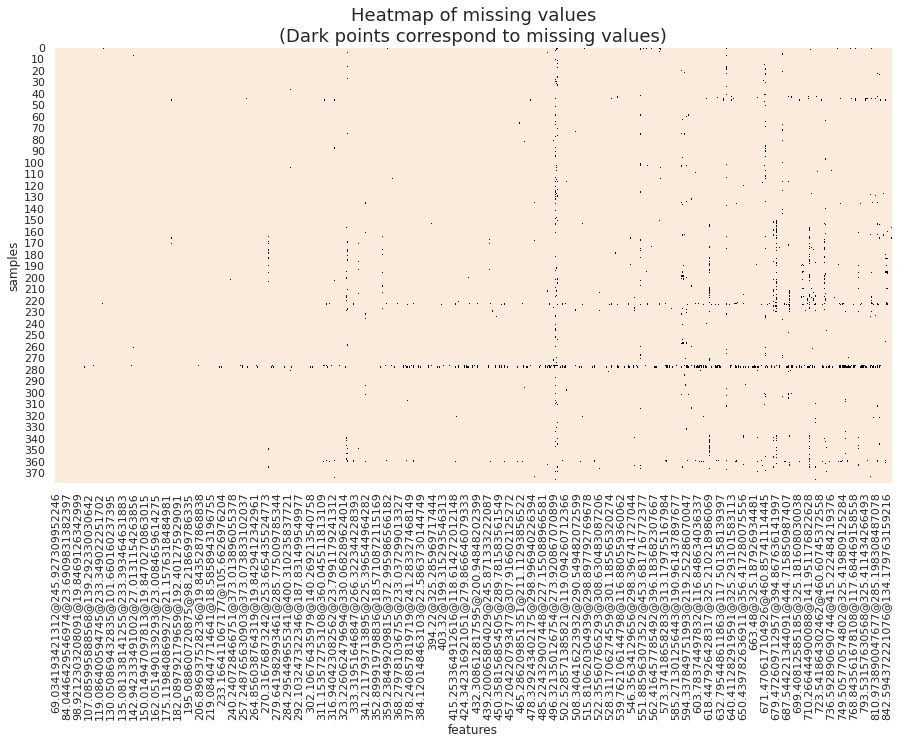

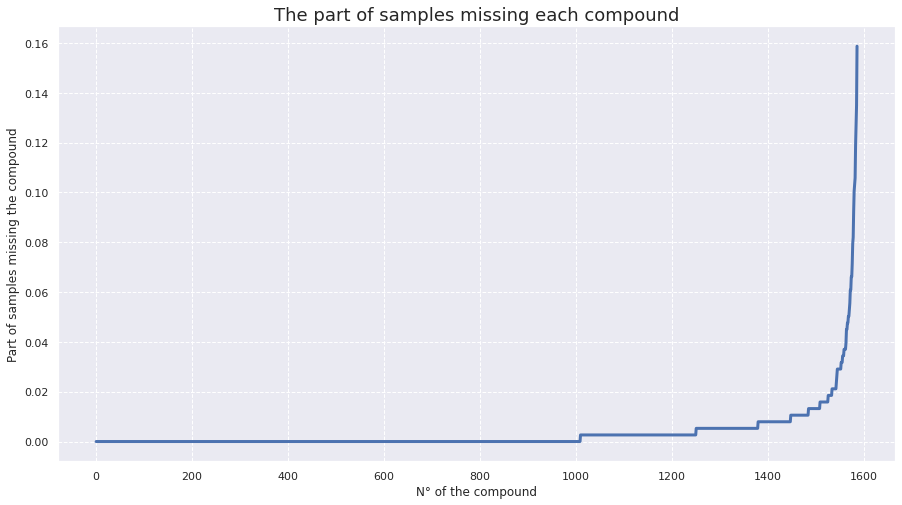



######################################################################################################################################################


In [21]:
plot_infos_missing_values(X, na_values=0)

## c - Correlation between features

######################################################################################################################################################


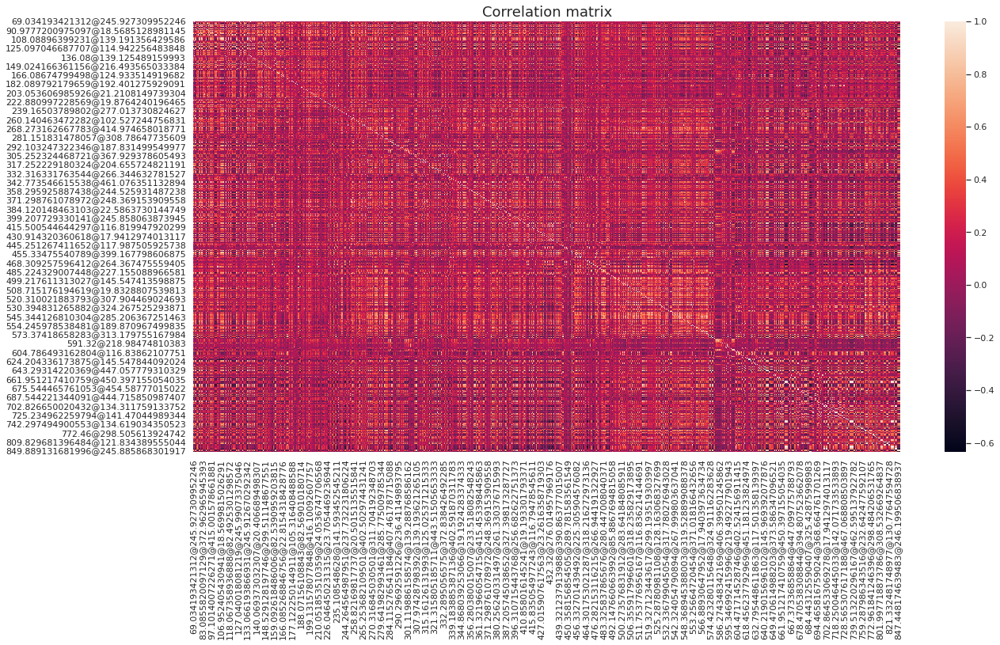

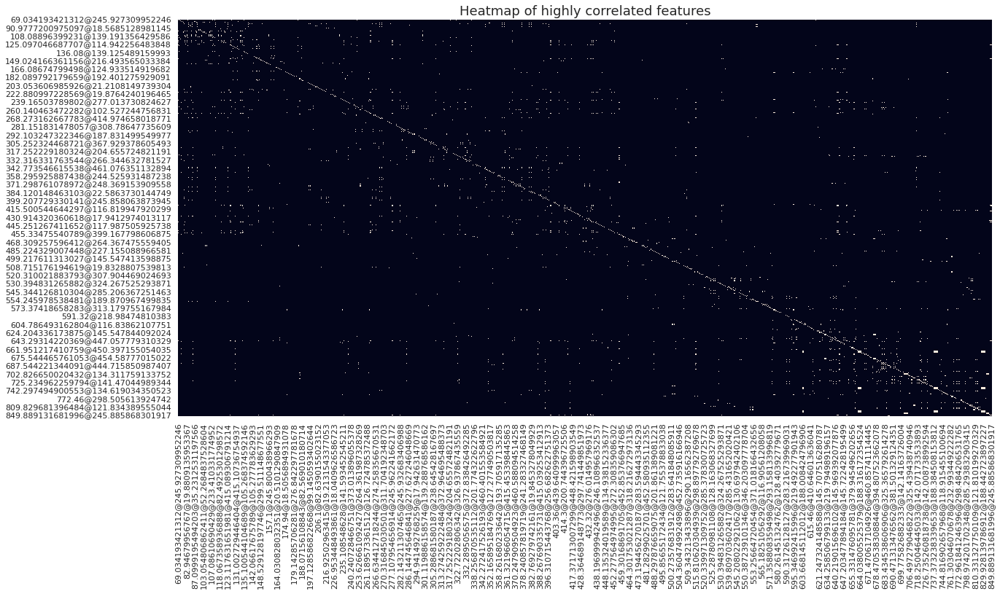



###################################################################################################################################################### 



In [22]:
plot_correlation_matrix(X, threshold=0.9)

## d - Remove strongly correlated features (to potentially avoid issues during further analysis)

In [23]:
X_remove_corr = remove_correlated_features(X)
X_remove_corr

Initial shape : (378, 1586)
Final shape : (378, 847)

Time to compute : 00h00m02s

 ######################################################################################################################################################






,69.034193421312@245.927309952246,69.0347519118582@139.172874889953,69.0703839837015@33.9940592171752,69.0705452827662@373.031465819143,70.0656402237219@22.7604988324661,71.085449630006@379.222418617272,71.0860210463123@415.343642215146,72.0810846503853@23.7091295964681,72.0806908589304@130.850159427121,79.0216519285783@23.9698168449792,...,777.696178010804@191.790292568525,780.450894783565@21.3246239321413,782.446860690462@21.2663973000584,784.443555404977@21.3085240411534,793.394953762325@159.161523082348,801.578577825127@415.835434317301,808.827768357206@121.844297000973,810.973890047677@285.198308487078,811.482813357802@285.090639445808,828.814036541285@17.9518107698261
0,230.127798,118.194026,757.591222,107.927970,950.757846,28.594198,46.730671,1762.311873,110.714424,1489.485358,...,168.293343,87.281493,114.272870,86.327480,78.569097,8.718127,492.940817,0.000000,1.843232,62.881243
1,587.927618,129.710850,594.600666,145.488720,896.401881,27.842101,73.665886,1551.050083,92.467096,1443.736018,...,180.437923,122.590588,184.186353,124.323715,53.271213,118.352041,296.075536,8.272602,15.004043,73.772876
2,300.579088,212.674262,658.022293,98.527020,646.353708,7.844530,214.083198,1574.624653,453.301630,1473.123244,...,294.376808,49.728629,75.405141,23.551183,275.545341,355.156901,10273.075768,107.822643,54.547985,55.881252
3,568.440320,222.858966,580.603252,114.068949,622.684905,15.184581,93.773480,1627.352106,386.058506,1522.180220,...,334.788918,62.333217,99.036423,48.765197,201.282244,186.219681,6893.760826,194.512799,80.189757,70.685903
4,237.746731,124.304083,645.234904,47.450318,731.368097,13.995820,86.307903,2185.432179,489.903128,456.882836,...,777.308941,123.974487,105.762154,99.844283,292.836373,520.759375,26679.088113,27.546645,54.591839,47.332427
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
373,1008.902996,30.604424,246.467121,785.677459,277.458326,428.994807,513.576400,435.752104,122.025016,73.071403,...,569.788462,139.125135,156.330978,132.401103,31.740749,403.681149,1024.425785,101.670084,151.700275,18.396687
374,989.869316,42.869602,171.359314,392.755907,209.780709,515.953289,454.149754,251.946306,173.765368,53.586484,...,284.864970,100.788073,121.613992,87.921630,36.306964,568.353277,1266.524376,127.535495,171.474459,24.766198
375,1050.722511,30.771758,161.726294,410.149582,236.145254,553.329039,509.207554,232.200898,158.721836,55.677307,...,302.036922,86.006847,103.006758,73.104365,20.837174,291.214959,1146.960035,126.298995,136.702090,40.520179
376,1063.436804,389.046294,323.123227,427.651740,201.404361,323.780079,326.438945,733.334184,341.597362,60.501829,...,607.840190,45.362658,60.159764,50.237835,97.403545,440.264888,6981.118945,181.652288,197.717664,47.058676


In [24]:
peakTable_remove_corr = pd.concat([metadata, X_remove_corr], axis=1)
peakTable_remove_corr

,Sample Name,Disease,69.034193421312@245.927309952246,69.0347519118582@139.172874889953,69.0703839837015@33.9940592171752,69.0705452827662@373.031465819143,70.0656402237219@22.7604988324661,71.085449630006@379.222418617272,71.0860210463123@415.343642215146,72.0810846503853@23.7091295964681,...,777.696178010804@191.790292568525,780.450894783565@21.3246239321413,782.446860690462@21.2663973000584,784.443555404977@21.3085240411534,793.394953762325@159.161523082348,801.578577825127@415.835434317301,808.827768357206@121.844297000973,810.973890047677@285.198308487078,811.482813357802@285.090639445808,828.814036541285@17.9518107698261
0,Exp1_CRR_1a_POS,CRR,230.127798,118.194026,757.591222,107.927970,950.757846,28.594198,46.730671,1762.311873,...,168.293343,87.281493,114.272870,86.327480,78.569097,8.718127,492.940817,0.000000,1.843232,62.881243
1,Exp1_CRR_1b_POS,CRR,587.927618,129.710850,594.600666,145.488720,896.401881,27.842101,73.665886,1551.050083,...,180.437923,122.590588,184.186353,124.323715,53.271213,118.352041,296.075536,8.272602,15.004043,73.772876
2,Exp1_CRR_3a_POS,CRR,300.579088,212.674262,658.022293,98.527020,646.353708,7.844530,214.083198,1574.624653,...,294.376808,49.728629,75.405141,23.551183,275.545341,355.156901,10273.075768,107.822643,54.547985,55.881252
3,Exp1_CRR_3b_POS,CRR,568.440320,222.858966,580.603252,114.068949,622.684905,15.184581,93.773480,1627.352106,...,334.788918,62.333217,99.036423,48.765197,201.282244,186.219681,6893.760826,194.512799,80.189757,70.685903
4,Exp1_CRR_4a_POS,CRR,237.746731,124.304083,645.234904,47.450318,731.368097,13.995820,86.307903,2185.432179,...,777.308941,123.974487,105.762154,99.844283,292.836373,520.759375,26679.088113,27.546645,54.591839,47.332427
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
373,Exp1_HCC_60b_POS,HCC,1008.902996,30.604424,246.467121,785.677459,277.458326,428.994807,513.576400,435.752104,...,569.788462,139.125135,156.330978,132.401103,31.740749,403.681149,1024.425785,101.670084,151.700275,18.396687
374,Exp1_HCC_63a_POS,HCC,989.869316,42.869602,171.359314,392.755907,209.780709,515.953289,454.149754,251.946306,...,284.864970,100.788073,121.613992,87.921630,36.306964,568.353277,1266.524376,127.535495,171.474459,24.766198
375,Exp1_HCC_63b_POS,HCC,1050.722511,30.771758,161.726294,410.149582,236.145254,553.329039,509.207554,232.200898,...,302.036922,86.006847,103.006758,73.104365,20.837174,291.214959,1146.960035,126.298995,136.702090,40.520179
376,Exp1_HCC_64a_POS,HCC,1063.436804,389.046294,323.123227,427.651740,201.404361,323.780079,326.438945,733.334184,...,607.840190,45.362658,60.159764,50.237835,97.403545,440.264888,6981.118945,181.652288,197.717664,47.058676


## e - PCA

In [26]:
if plot_infos_missing_values(X, plot=False) == 0:
    cb.plot.pca(X, pcx=1, pcy=2, group_label=target)
else:
    print('NaNs in peak table, please impute before using PCA')

Loading BokehJS ...

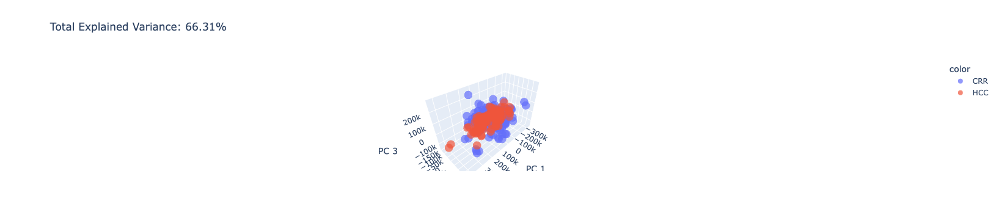

In [27]:
if plot_infos_missing_values(X, plot=False) == 0:
    PCA_3D(X, peakTable, target.name)
else:
    print('NaNs in peak table, please impute before using PCA')

## f - Target visualisation

In [28]:
# target = 

######################################################################################################################################################
Target values : 
CRR    258
HCC    120
Name: Disease, dtype: int64



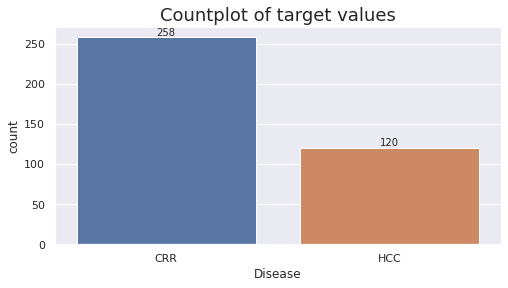

###################################################################################################################################################### 



In [29]:
plot_target(target)

## g - Feature visualisation

The following visualisations show the distributions of the chosen features of the peak table.

### We can set the number of features with <code>nb_features</code> parameter, which will plot the first N features of the peak table.

######################################################################################################################################################



<Figure size 720x720 with 0 Axes>

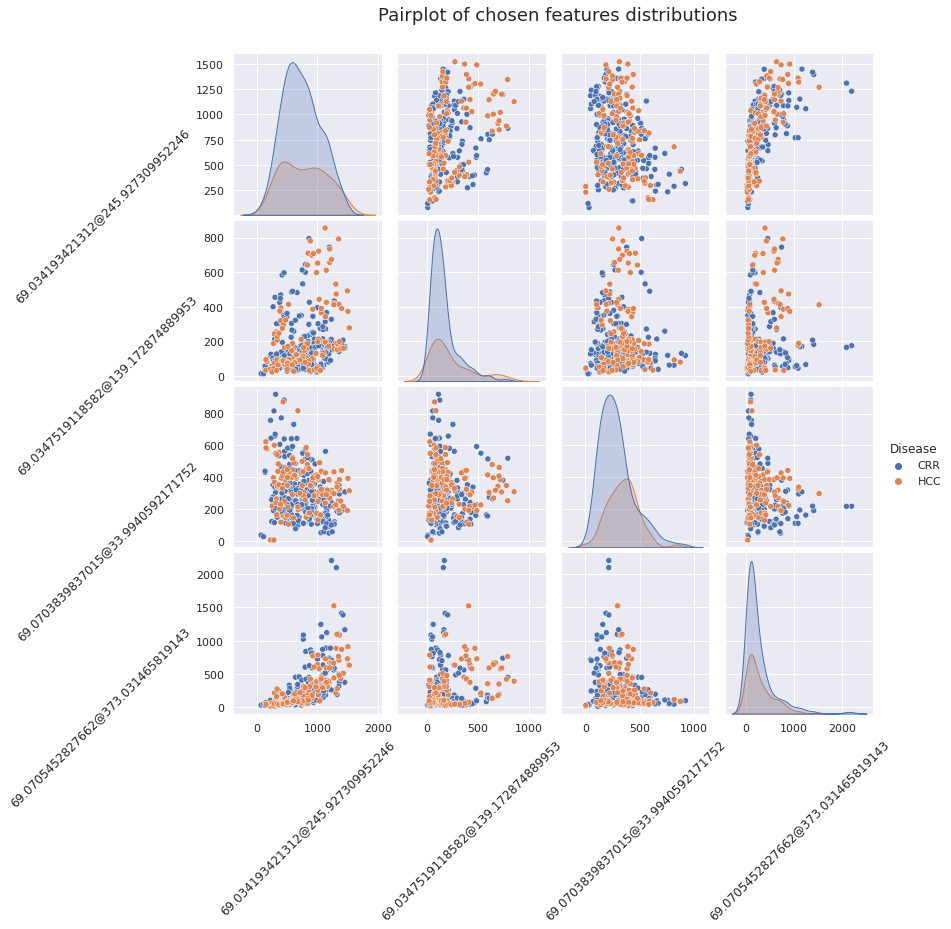

###################################################################################################################################################### 



In [30]:
plot_pairplot_distributions(X, target, nb_features=4)

### We can also set the list of features we want to plot with <code>list_features</code> parameter.

In [31]:
n_features = 3

list_features = random.sample(X.columns.tolist(), n_features)
list_features

['448.135324019589@134.938152336377',
 '267.642236843479@299.471138030628',
 '383.27555876428@268.662470108455']

######################################################################################################################################################



<Figure size 720x720 with 0 Axes>

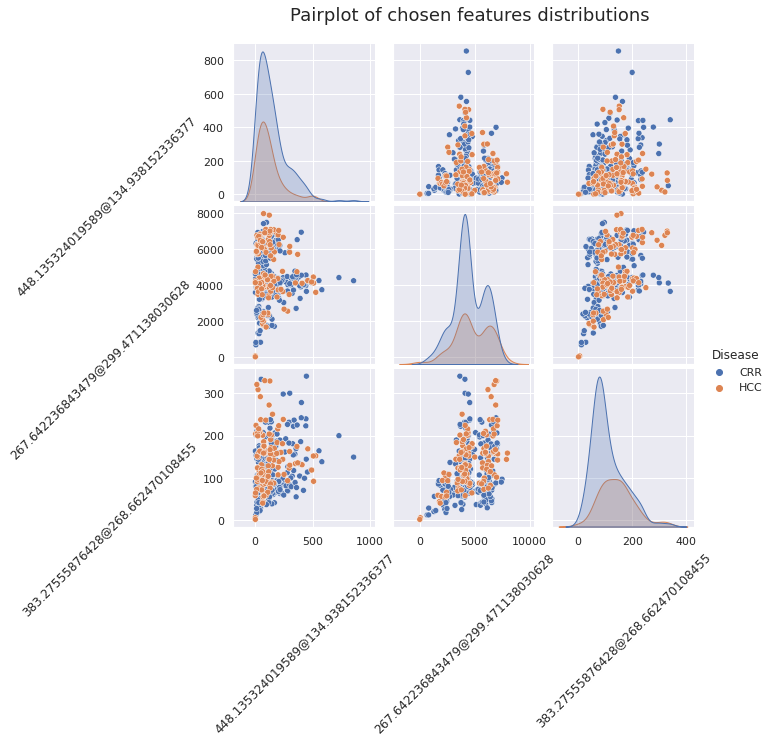

###################################################################################################################################################### 



In [32]:
plot_pairplot_distributions(X, target, list_features=list_features)

### Here we can observe histogram and boxplot for each chosen feature

######################################################################################################################################################

------------------------------------------------------------------------------------------------------------------------


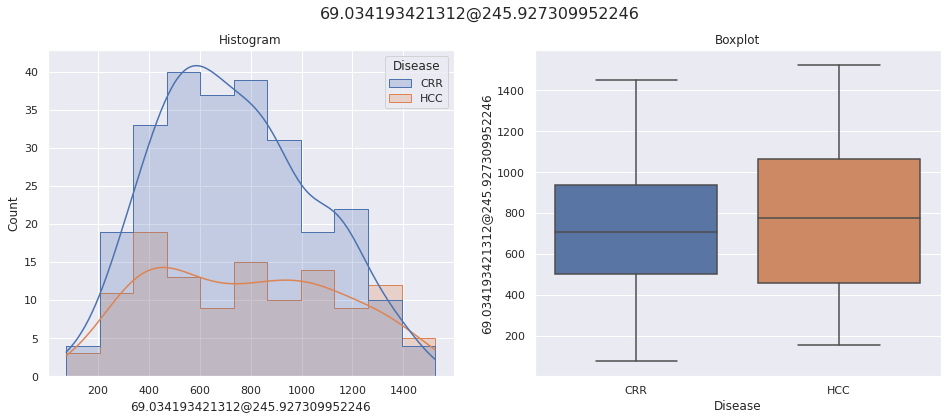

------------------------------------------------------------------------------------------------------------------------


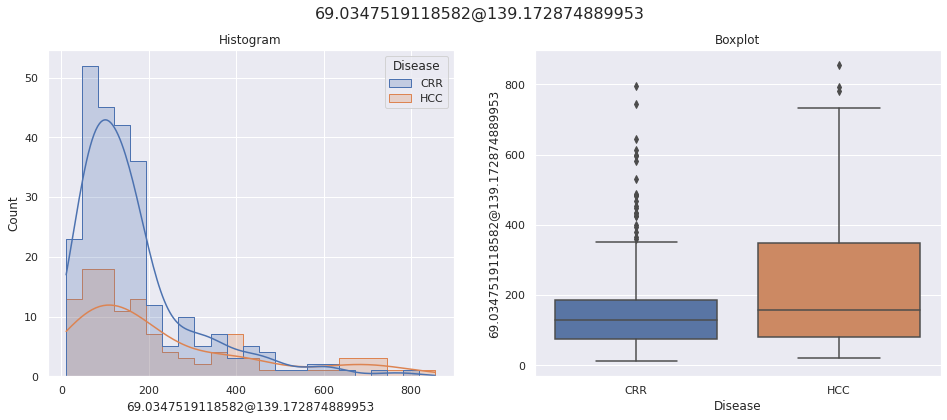

------------------------------------------------------------------------------------------------------------------------


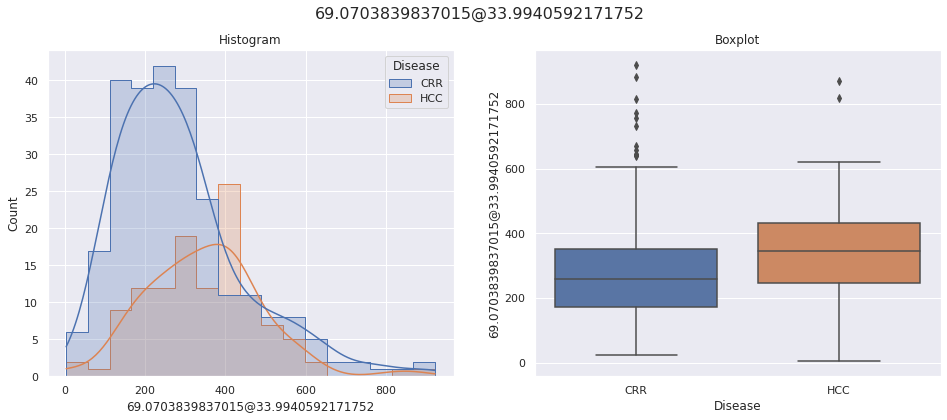

------------------------------------------------------------------------------------------------------------------------


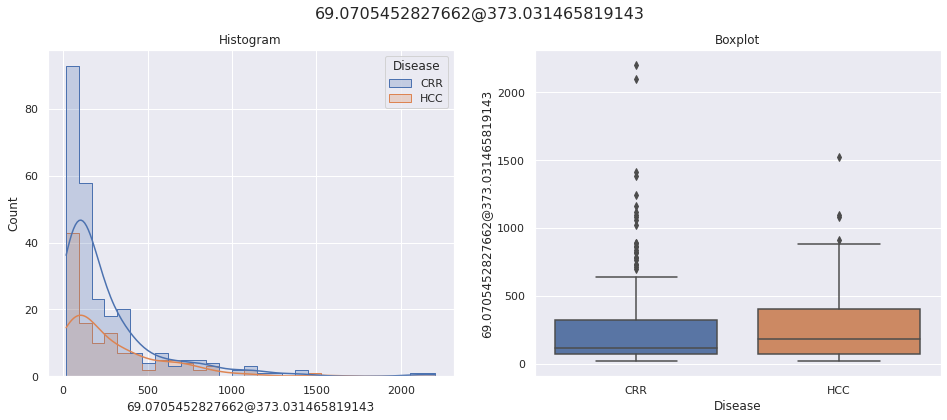

------------------------------------------------------------------------------------------------------------------------ 

######################################################################################################################################################


In [33]:
plot_hist_boxplot_distributions(X, target, nb_features=4)

######################################################################################################################################################

------------------------------------------------------------------------------------------------------------------------


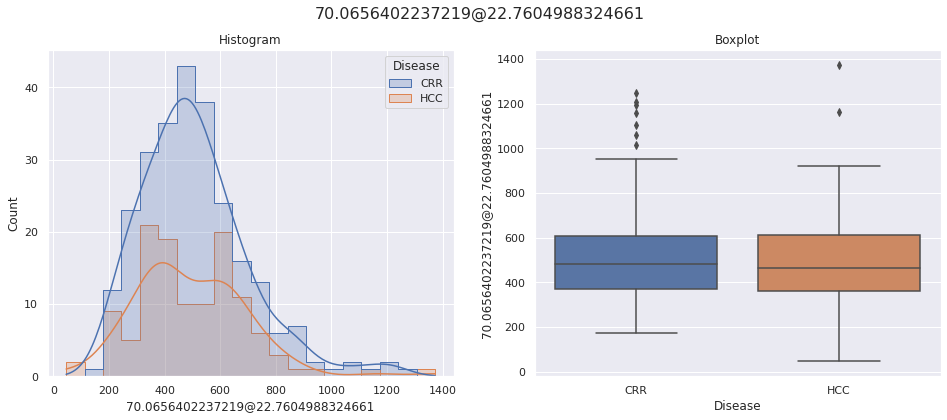

------------------------------------------------------------------------------------------------------------------------


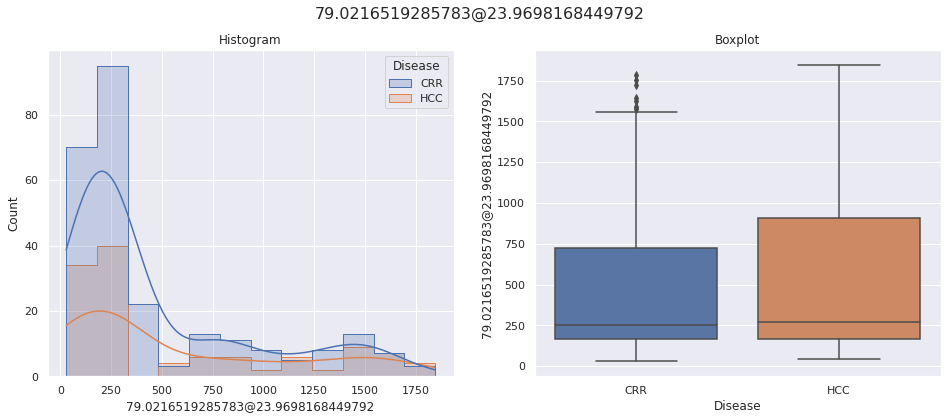

------------------------------------------------------------------------------------------------------------------------


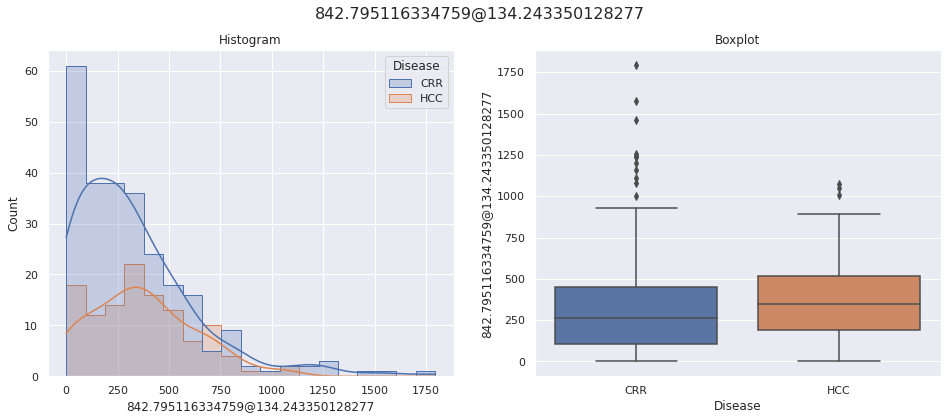

------------------------------------------------------------------------------------------------------------------------ 

######################################################################################################################################################


In [34]:
list_features = ['70.0656402237219@22.7604988324661', '79.0216519285783@23.9698168449792', '842.795116334759@134.243350128277']

plot_hist_boxplot_distributions(X, target, list_features=list_features)

# 3 - Impute missing values

In [35]:
from missing_value_imputation_functions import *

### We observed before that missing values are here 0's. For further analysis, we prefer to avoid having 0's for mathematical purposes, we can replace these zeros by other values

######################################################################################################################################################
Considering 0 as missing values :
- Total number of missing values : 2143
- Percent of missing values : 0.36%



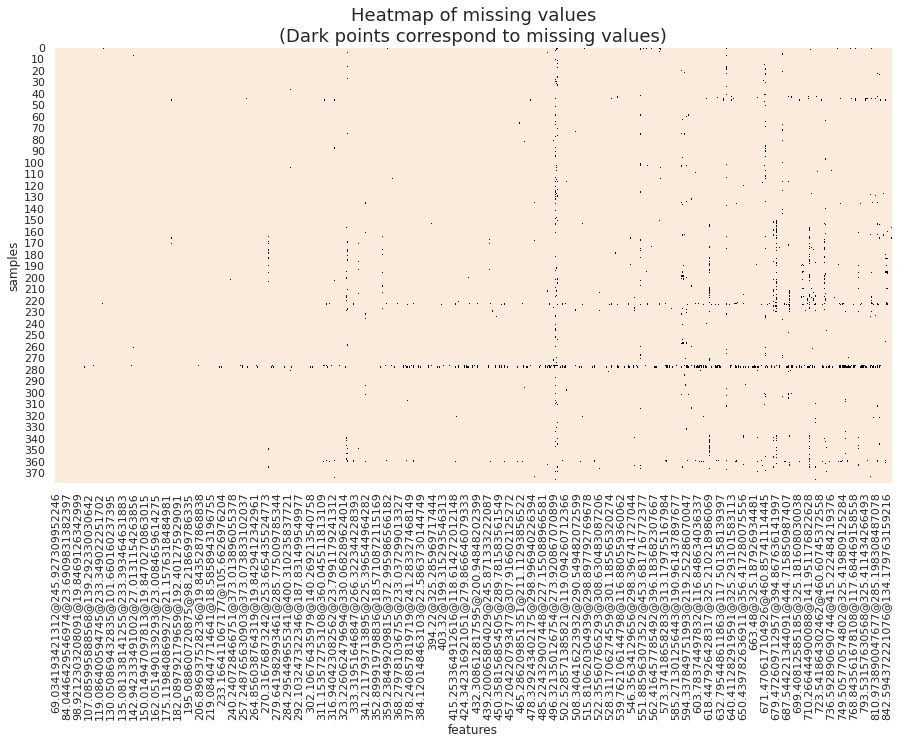

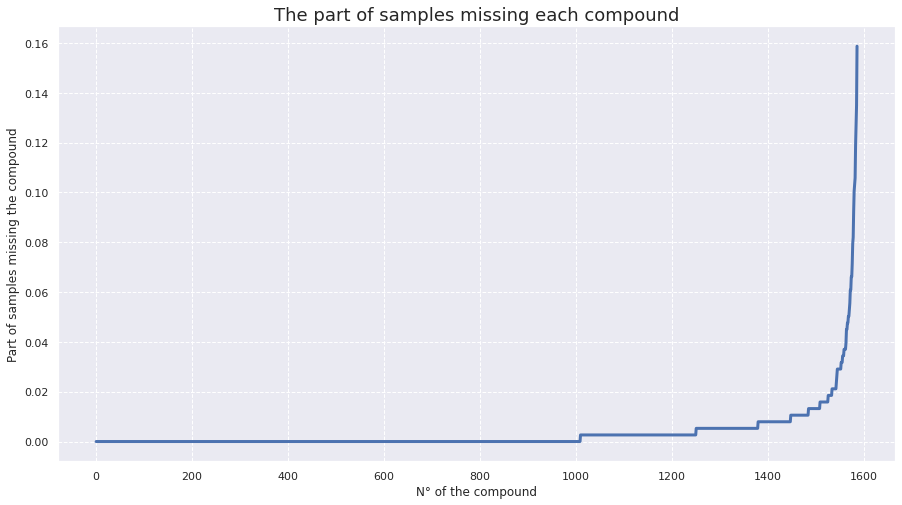



######################################################################################################################################################


In [36]:
plot_infos_missing_values(X, na_values=0)

### Set 0 to NaN to then impute with chosen imputer

In [37]:
X_with_Nan = X.copy()
X_with_Nan[X_with_Nan == 0] = np.nan

## a - Impute intensities with 1's

In [38]:
X_imp_1 = const_imputer(X_with_Nan, 1)
X_imp_1

,69.034193421312@245.927309952246,69.0347519118582@139.172874889953,69.0703839837015@33.9940592171752,69.0705452827662@373.031465819143,70.0656402237219@22.7604988324661,71.085449630006@379.222418617272,71.0860210463123@415.343642215146,72.0810846503853@23.7091295964681,72.0806908589304@130.850159427121,79.0216519285783@23.9698168449792,...,842.795116334759@134.243350128277,842.995196023264@134.17823047015,843.195277057917@134.085230424832,846.444435650557@246.201206619627,847.448174639483@246.199506838937,848.38745497379@245.903140535829,848.885621429239@245.902303453468,849.388345280949@245.887139929679,849.889131681996@245.885868301917,849.928235681684@126.237312302097
0,230.127798,118.194026,757.591222,107.927970,950.757846,28.594198,46.730671,1762.311873,110.714424,1489.485358,...,118.231221,111.867500,81.669004,120.860379,63.647664,26.854367,21.924561,6.821398,2.156990,67.549779
1,587.927618,129.710850,594.600666,145.488720,896.401881,27.842101,73.665886,1551.050083,92.467096,1443.736018,...,50.584648,52.091682,27.073475,404.589261,223.520876,442.007981,402.357357,281.384643,128.797298,47.651690
2,300.579088,212.674262,658.022293,98.527020,646.353708,7.844530,214.083198,1574.624653,453.301630,1473.123244,...,1112.409878,975.970006,680.246087,53.616534,37.061376,74.074524,84.825422,48.473490,27.935645,80.914510
3,568.440320,222.858966,580.603252,114.068949,622.684905,15.184581,93.773480,1627.352106,386.058506,1522.180220,...,728.723647,634.409467,421.469118,197.209960,170.212911,375.213998,360.015568,234.676324,82.684350,76.567716
4,237.746731,124.304083,645.234904,47.450318,731.368097,13.995820,86.307903,2185.432179,489.903128,456.882836,...,831.834366,740.936243,456.295758,39.328490,26.711362,58.673974,89.294382,44.567909,11.712702,100.326460
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
373,1008.902996,30.604424,246.467121,785.677459,277.458326,428.994807,513.576400,435.752104,122.025016,73.071403,...,13.108141,17.362689,12.872893,270.601235,129.342502,711.259570,681.918379,415.284426,180.770813,54.829076
374,989.869316,42.869602,171.359314,392.755907,209.780709,515.953289,454.149754,251.946306,173.765368,53.586484,...,17.363786,7.213925,5.771138,313.177025,126.714662,871.678160,852.241868,532.747944,223.508213,70.677193
375,1050.722511,30.771758,161.726294,410.149582,236.145254,553.329039,509.207554,232.200898,158.721836,55.677307,...,17.349835,22.410207,15.904014,306.347355,182.640853,847.550776,903.968504,561.767012,263.886891,53.453130
376,1063.436804,389.046294,323.123227,427.651740,201.404361,323.780079,326.438945,733.334184,341.597362,60.501829,...,398.535328,313.529325,178.762242,172.122525,87.828888,643.123226,663.230258,399.842543,143.443414,130.069887


## b - Impute intensities with half minimum value in features

In [39]:
X_imp_halfmin = half_min_imputer(X_with_Nan)
X_imp_halfmin

,69.034193421312@245.927309952246,69.0347519118582@139.172874889953,69.0703839837015@33.9940592171752,69.0705452827662@373.031465819143,70.0656402237219@22.7604988324661,71.085449630006@379.222418617272,71.0860210463123@415.343642215146,72.0810846503853@23.7091295964681,72.0806908589304@130.850159427121,79.0216519285783@23.9698168449792,...,842.795116334759@134.243350128277,842.995196023264@134.17823047015,843.195277057917@134.085230424832,846.444435650557@246.201206619627,847.448174639483@246.199506838937,848.38745497379@245.903140535829,848.885621429239@245.902303453468,849.388345280949@245.887139929679,849.889131681996@245.885868301917,849.928235681684@126.237312302097
0,230.127798,118.194026,757.591222,107.927970,950.757846,28.594198,46.730671,1762.311873,110.714424,1489.485358,...,118.231221,111.867500,81.669004,120.860379,63.647664,26.854367,21.924561,6.821398,2.156990,67.549779
1,587.927618,129.710850,594.600666,145.488720,896.401881,27.842101,73.665886,1551.050083,92.467096,1443.736018,...,50.584648,52.091682,27.073475,404.589261,223.520876,442.007981,402.357357,281.384643,128.797298,47.651690
2,300.579088,212.674262,658.022293,98.527020,646.353708,7.844530,214.083198,1574.624653,453.301630,1473.123244,...,1112.409878,975.970006,680.246087,53.616534,37.061376,74.074524,84.825422,48.473490,27.935645,80.914510
3,568.440320,222.858966,580.603252,114.068949,622.684905,15.184581,93.773480,1627.352106,386.058506,1522.180220,...,728.723647,634.409467,421.469118,197.209960,170.212911,375.213998,360.015568,234.676324,82.684350,76.567716
4,237.746731,124.304083,645.234904,47.450318,731.368097,13.995820,86.307903,2185.432179,489.903128,456.882836,...,831.834366,740.936243,456.295758,39.328490,26.711362,58.673974,89.294382,44.567909,11.712702,100.326460
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
373,1008.902996,30.604424,246.467121,785.677459,277.458326,428.994807,513.576400,435.752104,122.025016,73.071403,...,13.108141,17.362689,12.872893,270.601235,129.342502,711.259570,681.918379,415.284426,180.770813,54.829076
374,989.869316,42.869602,171.359314,392.755907,209.780709,515.953289,454.149754,251.946306,173.765368,53.586484,...,17.363786,7.213925,5.771138,313.177025,126.714662,871.678160,852.241868,532.747944,223.508213,70.677193
375,1050.722511,30.771758,161.726294,410.149582,236.145254,553.329039,509.207554,232.200898,158.721836,55.677307,...,17.349835,22.410207,15.904014,306.347355,182.640853,847.550776,903.968504,561.767012,263.886891,53.453130
376,1063.436804,389.046294,323.123227,427.651740,201.404361,323.780079,326.438945,733.334184,341.597362,60.501829,...,398.535328,313.529325,178.762242,172.122525,87.828888,643.123226,663.230258,399.842543,143.443414,130.069887


### We can check that there is no more missing values in the imputed peak tables

In [40]:
plot_infos_missing_values(X_imp_1, na_values=0)

######################################################################################################################################################
Considering 0 as missing values :
- Total number of missing values : 0
- Percent of missing values : 0.00%



0

In [41]:
plot_infos_missing_values(X_imp_halfmin, na_values=0)

######################################################################################################################################################
Considering 0 as missing values :
- Total number of missing values : 0
- Percent of missing values : 0.00%



0

# 4 - Transformations

In [42]:
from normalisation_scaling_functions import *

## a - log transformation

In [43]:
X_imp_halfmin_log = normPeakTable(X_imp_halfmin, 'log10', based='metabolite')
X_imp_halfmin_log

,69.034193421312@245.927309952246,69.0347519118582@139.172874889953,69.0703839837015@33.9940592171752,69.0705452827662@373.031465819143,70.0656402237219@22.7604988324661,71.085449630006@379.222418617272,71.0860210463123@415.343642215146,72.0810846503853@23.7091295964681,72.0806908589304@130.850159427121,79.0216519285783@23.9698168449792,...,842.795116334759@134.243350128277,842.995196023264@134.17823047015,843.195277057917@134.085230424832,846.444435650557@246.201206619627,847.448174639483@246.199506838937,848.38745497379@245.903140535829,848.885621429239@245.902303453468,849.388345280949@245.887139929679,849.889131681996@245.885868301917,849.928235681684@126.237312302097
0,2.361969,2.072596,2.879435,2.033134,2.978070,1.456278,1.669602,3.246083,2.044204,3.173036,...,2.072732,2.048704,1.912057,2.082284,1.803782,1.429015,1.340931,0.833873,0.333848,1.829624
1,2.769324,2.112976,2.774225,2.162829,2.952503,1.444702,1.867266,3.190626,1.965987,3.159488,...,1.704019,1.716768,1.432544,2.607014,2.349318,2.645430,2.604612,2.449300,2.109907,1.678078
2,2.477959,2.327715,2.818241,1.993555,2.810470,0.894567,2.330583,3.197177,2.656387,3.168239,...,3.046265,2.989436,2.832666,1.729299,1.568922,1.869669,1.928526,1.685504,1.446159,1.908026
3,2.754685,2.348030,2.763879,2.057167,2.794268,1.181403,1.972080,3.211482,2.586653,3.182466,...,2.862563,2.802370,2.624766,2.294929,2.230992,2.574279,2.556321,2.370469,1.917423,1.884046
4,2.376115,2.094485,2.809718,1.676239,2.864136,1.145998,1.936051,3.339537,2.690110,2.659805,...,2.920037,2.869781,2.659246,1.594707,1.426696,1.768446,1.950824,1.649022,1.068657,2.001415
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
373,3.003849,1.485784,2.391759,2.895244,2.443198,2.632452,2.710605,2.639239,2.086449,1.863747,...,1.117541,1.239617,1.109676,2.432330,2.111741,2.852028,2.833732,2.618346,2.257128,1.739011
374,2.995578,1.632149,2.233908,2.594123,2.321766,2.712610,2.657199,2.401308,2.239963,1.729055,...,1.239644,0.858172,0.761261,2.495790,2.102827,2.940356,2.930563,2.726522,2.349293,1.849279
375,3.021488,1.488152,2.208781,2.612942,2.373179,2.742983,2.706895,2.365864,2.200637,1.745678,...,1.239295,1.350446,1.201507,2.486214,2.261598,2.928166,2.956153,2.749556,2.421418,1.727973
376,3.026712,2.590001,2.509368,2.631090,2.304069,2.510250,2.513802,2.865302,2.533515,1.781769,...,2.600467,2.496278,2.252276,2.235838,1.943637,2.808294,2.821664,2.601889,2.156681,2.114177


## b - Standard scale intensities

In [44]:
X_imp_halfmin_log_std = normPeakTable(X_imp_halfmin_log, 'autoscaling', based='metabolites')
X_imp_halfmin_log_std

,69.034193421312@245.927309952246,69.0347519118582@139.172874889953,69.0703839837015@33.9940592171752,69.0705452827662@373.031465819143,70.0656402237219@22.7604988324661,71.085449630006@379.222418617272,71.0860210463123@415.343642215146,72.0810846503853@23.7091295964681,72.0806908589304@130.850159427121,79.0216519285783@23.9698168449792,...,842.795116334759@134.243350128277,842.995196023264@134.17823047015,843.195277057917@134.085230424832,846.444435650557@246.201206619627,847.448174639483@246.199506838937,848.38745497379@245.903140535829,848.885621429239@245.902303453468,849.388345280949@245.887139929679,849.889131681996@245.885868301917,849.928235681684@126.237312302097
0,-2.155049,-0.163929,1.691855,-0.423296,1.721185,-0.430002,-1.745644,1.576473,-0.476163,1.603356,...,-0.256590,-0.201460,-0.105356,-1.807678,-1.770322,-4.014878,-3.824317,-4.738077,-5.247777,-0.452927
1,-0.277442,-0.048455,1.306835,-0.116152,1.579260,-0.444095,-1.221327,1.341342,-0.749849,1.571191,...,-0.776384,-0.684658,-0.776873,-0.392128,-0.348893,-0.720180,-0.718931,-0.600663,-0.556465,-0.729910
2,-1.620422,0.565620,1.467911,-0.517026,0.790828,-1.113843,0.007648,1.369118,1.665899,1.591967,...,1.115847,1.167962,1.183877,-2.759917,-2.382267,-2.821353,-2.380353,-2.556889,-2.309700,-0.309628
3,-0.344917,0.623714,1.268974,-0.366380,0.700891,-0.764642,-0.943302,1.429767,1.421896,1.625743,...,0.856874,0.895649,0.892730,-1.234032,-0.657198,-0.912895,-0.837601,-0.802565,-1.064894,-0.353458
4,-2.089849,-0.101332,1.436722,-1.268494,1.088730,-0.807744,-1.038872,1.972709,1.783898,0.384916,...,0.937898,0.993780,0.941017,-3.123000,-2.752845,-3.095520,-2.325558,-2.650326,-3.306840,-0.138939
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
373,0.803550,-1.841996,-0.092821,1.618352,-1.247925,1.001900,1.015681,-0.996472,-0.328347,-1.504970,...,-1.603171,-1.379247,-1.229021,-0.863370,-0.967915,-0.160602,-0.155888,-0.167706,-0.167591,-0.618542
374,0.765424,-1.423444,-0.670486,0.905237,-1.922002,1.099487,0.874018,-2.005273,0.208808,-1.824737,...,-1.431036,-1.934516,-1.716945,-0.692175,-0.991142,0.078637,0.082065,0.109353,0.075855,-0.417002
375,0.884851,-1.835224,-0.762440,0.949805,-1.636602,1.136464,1.005839,-2.155552,0.071203,-1.785273,...,-1.431528,-1.217913,-1.100420,-0.718007,-0.577453,0.045619,0.144951,0.168349,0.266366,-0.638716
376,0.908928,1.315663,0.337576,0.992783,-2.020238,0.853129,0.493648,-0.037993,1.235961,-1.699593,...,0.487384,0.450073,0.371091,-1.393441,-1.405920,-0.279057,-0.185544,-0.209855,-0.432916,0.067158


# 5 - Dimensionality reduction

In [45]:
from dimensionality_reduction_functions import *

## a - PCA then t-SNE

### The point of this step is to reduce dimensionality, argument <code>part_explained_variance</code> can be changed to set the part of initial explained variance we want to keep after reduction. We can also set the <code>n_components</code> argument to keep a specific number of PCA components.

In [46]:
# target = 

#################################################################################################### 



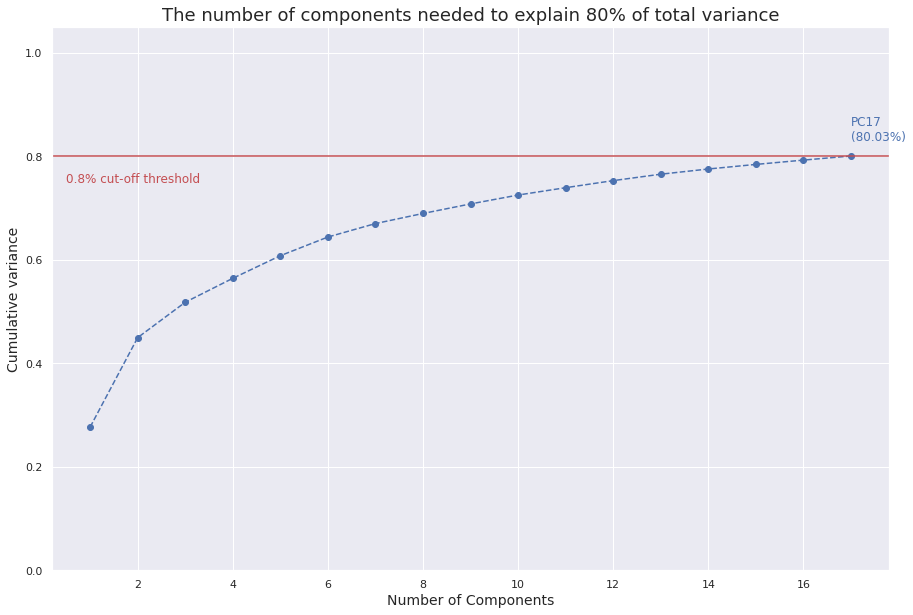

Initial number of dimension : 1586
Final number of dimension : 17


,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17
0,38.263029,-38.899464,40.451479,2.828415,-16.140101,7.059197,-12.208668,10.882638,-10.805735,5.909199,0.582419,17.525312,3.782093,2.945090,-5.639086,11.870473,0.275070
1,19.208947,-14.814078,36.751270,-2.597017,-15.572452,0.304130,-14.570406,4.886910,-5.256315,1.900542,-0.536348,14.555199,2.294603,1.017516,-7.044592,6.453381,1.347587
2,-9.791143,-36.555752,9.420817,0.173735,3.905417,12.719267,-5.228959,2.736026,5.631235,-0.701073,4.184202,-9.332377,3.321337,-1.307166,1.451659,5.831908,-8.721881
3,-13.162659,-29.867584,10.029328,-3.743341,2.215305,1.407380,-6.212295,-3.841995,2.147788,-0.569237,0.933982,3.342598,3.288729,3.752555,-2.159096,3.920992,-6.427205
4,4.632416,-47.642028,-3.083302,5.430645,-0.694918,16.592915,-12.681830,2.259877,-5.483652,-0.888933,-1.129971,-2.707137,8.564983,-3.146747,5.083000,7.835856,-2.045723
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
373,0.680134,17.463544,5.712386,-8.723714,-6.514641,12.720610,11.481007,-1.376009,-0.077142,-0.162634,-1.046289,-1.810613,-0.166604,-9.778864,-7.496671,3.711210,-0.353946
374,3.777193,14.795475,-1.776100,-10.203384,-11.093072,11.887964,2.604583,-6.183654,-9.316949,-4.804944,-4.337295,1.060946,-11.795057,-4.120782,5.261511,-3.860336,-8.845098
375,4.129335,16.219408,-1.487344,-10.431252,-10.851366,12.544219,2.076601,-6.207852,-8.497187,-4.952858,-3.804662,0.592728,-11.843893,-4.548429,5.282631,-3.894515,-9.298905
376,-6.139222,4.689792,-18.715945,-11.797325,-5.817102,6.404371,4.751143,-1.339992,-5.063011,-5.547848,2.987580,5.203491,0.740839,-1.938111,-3.869838,-1.256603,0.134167



 #################################################################################################### 

Time to compute t-SNE (input dataframe of shape (378, 17)) : 1.48 seconds

----------------------------------------------------------------------------------------------------


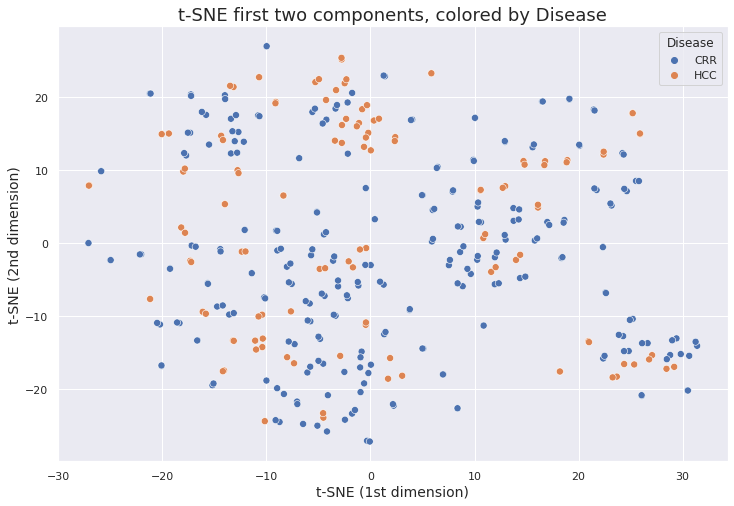

----------------------------------------------------------------------------------------------------


,tSNE1,tSNE2
0,5.077645,-14.434652
1,4.995806,-14.425549
2,-5.102887,-25.005274
3,-2.509762,-17.636435
4,2.228547,-22.263090
...,...,...
373,23.274023,-18.383383
374,18.209454,-17.573908
375,18.207623,-17.577387
376,20.949911,-13.425578


In [47]:
print(100 * '#', '\n')

matrix = X_imp_halfmin_log_std.copy()

X_imp_halfmin_log_std_PCA, explained_variance = perform_PCA(matrix, part_explained_variance=0.8, scale_before_PCA=False)
print(f'Initial number of dimension : {matrix.shape[1]}')
print(f'Final number of dimension : {explained_variance.shape[0]}')
display(X_imp_halfmin_log_std_PCA)

print('\n', 100 * '#', '\n')

n_components = 2
X_imp_halfmin_log_std_PCA_tSNE = perform_tSNE(X_imp_halfmin_log_std_PCA, metadata=metadata, n_components=n_components, targets_plot=[target.name])
display(X_imp_halfmin_log_std_PCA_tSNE)

## b - Feature selection keeping all features with ANOVA pvalue $\lt \alpha \hspace{0.39cm}$

In [48]:
#target = 
matrix = X_imp_halfmin_log_std.copy()

X_imp_halfmin_log_std_fs_anova, feature_scores = select_best_features(matrix, target, alpha=0.01)
print(f'Initial number of dimension : {matrix.shape[1]}')
print(f'Final number of dimension : {feature_scores.shape[0]}')
display(feature_scores)
display(X_imp_halfmin_log_std_fs_anova)

Initial number of dimension : 1586
Final number of dimension : 187


,features,f_scores,p_values
424,280.174987408036@120.280038621878,29.147,0.0000
752,414.3@200.744396725506,28.526,0.0000
329,239.091767530881@129.831708012227,28.003,0.0000
798,432.308612817595@200.94848202399,26.967,0.0000
223,179.068453316803@129.763533765852,26.669,0.0000
...,...,...,...
1254,624.204336173875@145.547844092024,6.802,0.0095
1476,737.822378893837@188.42008924544,6.785,0.0096
415,276.14@37.759807373932,6.775,0.0096
541,322.135352046269@139.305523760381,6.751,0.0097


,280.174987408036@120.280038621878,414.3@200.744396725506,239.091767530881@129.831708012227,432.308612817595@200.94848202399,179.068453316803@129.763533765852,691.218424118956@137.382602806589,689.715529955351@137.347388884695,690.718984719257@137.475973142268,335.138094143677@124.995038143219,450.319990714689@201.165577099087,...,431.315953732092@276.245164625987,620.244509699851@145.622516313083,185.08@290.60219062529,83.0495701076701@139.215857956976,321.258237042789@226.95950526058,624.204336173875@145.547844092024,737.822378893837@188.42008924544,276.14@37.759807373932,322.135352046269@139.305523760381,162.051490139293@23.0084659614275
0,-0.462195,1.780826,-0.874797,1.030187,-1.006257,1.082363,0.832837,0.978457,-1.355822,0.999332,...,1.480135,-0.354151,-1.462271,-0.048721,1.960583,0.129900,-2.319692,1.159482,0.308654,0.601642
1,-0.423173,1.780139,-0.512157,1.584288,-0.645454,0.929031,0.566685,0.866303,-1.274933,1.033326,...,1.604098,-0.435621,-1.167553,-0.328541,1.969072,0.309193,-2.692342,0.846618,0.547876,0.342792
2,0.780324,2.283431,2.625411,2.162371,2.992665,0.924128,0.653741,0.829364,1.188168,1.701731,...,0.794462,0.429835,0.923724,0.819558,1.091719,0.935755,0.914348,0.696048,0.692725,1.625282
3,0.695424,2.501720,2.575168,2.474072,2.946987,0.848987,0.564831,0.756096,0.976212,1.909526,...,0.846875,0.347673,1.058930,0.712810,1.194692,0.953836,0.707068,0.450566,0.977579,1.239526
4,-1.189762,-0.484087,1.489742,-0.982767,1.772137,0.868694,0.575296,0.807867,0.324834,-1.241475,...,0.176978,0.444603,0.501062,0.017163,-0.905161,1.005600,1.227141,0.972838,-0.045639,1.828503
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
373,-0.422134,-0.256678,-0.704538,-0.124130,-0.260924,0.033732,-0.614467,-0.089387,-0.790986,-1.447142,...,-0.063121,-1.364561,0.959628,-1.453778,1.376534,-0.536678,-2.152252,1.118751,-1.102957,0.210707
374,-0.911108,0.208441,-0.679036,0.104093,-0.088302,-0.582492,-1.609007,-0.965342,-0.370084,-0.163600,...,-0.407685,-1.806788,0.711888,-1.048196,0.747641,-1.226993,0.131263,0.730078,-0.649880,0.014062
375,-0.839770,0.197326,-0.720899,0.037104,-0.017409,-0.781134,-1.926004,-1.183231,-0.455477,-0.258571,...,-0.460042,-1.824062,0.646493,-1.078019,0.702932,-1.202912,-0.116772,0.739448,-0.589568,-0.370846
376,-0.281305,-0.786227,1.397879,0.342230,2.014561,-0.891026,-0.971194,-0.866994,0.781552,0.435582,...,-0.844713,-0.760967,1.359120,1.596605,-0.265462,0.181156,0.517383,1.672583,1.387692,0.999501


## c - Feature selection keeping a specific number of features

### Keeping 10 features

In [49]:
#target = 
matrix = X_imp_halfmin_log_std.copy()

X_imp_halfmin_log_std_fs_nb_10, feature_scores = select_best_features(matrix, target, k=10)
print(f'Initial number of dimension : {matrix.shape[1]}')
print(f'Final number of dimension : {feature_scores.shape[0]}')
display(feature_scores)
display(X_imp_halfmin_log_std_fs_nb_10)

Initial number of dimension : 1586
Final number of dimension : 10


,features,f_scores,p_values
424,280.174987408036@120.280038621878,29.147,0.0
752,414.3@200.744396725506,28.526,0.0
329,239.091767530881@129.831708012227,28.003,0.0
798,432.308612817595@200.94848202399,26.967,0.0
223,179.068453316803@129.763533765852,26.669,0.0
1396,691.218424118956@137.382602806589,26.033,0.0
1388,689.715529955351@137.347388884695,24.638,0.0
1394,690.718984719257@137.475973142268,24.378,0.0
570,335.138094143677@124.995038143219,23.994,0.0
838,450.319990714689@201.165577099087,23.863,0.0


,280.174987408036@120.280038621878,414.3@200.744396725506,239.091767530881@129.831708012227,432.308612817595@200.94848202399,179.068453316803@129.763533765852,691.218424118956@137.382602806589,689.715529955351@137.347388884695,690.718984719257@137.475973142268,335.138094143677@124.995038143219,450.319990714689@201.165577099087
0,-0.462195,1.780826,-0.874797,1.030187,-1.006257,1.082363,0.832837,0.978457,-1.355822,0.999332
1,-0.423173,1.780139,-0.512157,1.584288,-0.645454,0.929031,0.566685,0.866303,-1.274933,1.033326
2,0.780324,2.283431,2.625411,2.162371,2.992665,0.924128,0.653741,0.829364,1.188168,1.701731
3,0.695424,2.501720,2.575168,2.474072,2.946987,0.848987,0.564831,0.756096,0.976212,1.909526
4,-1.189762,-0.484087,1.489742,-0.982767,1.772137,0.868694,0.575296,0.807867,0.324834,-1.241475
...,...,...,...,...,...,...,...,...,...,...
373,-0.422134,-0.256678,-0.704538,-0.124130,-0.260924,0.033732,-0.614467,-0.089387,-0.790986,-1.447142
374,-0.911108,0.208441,-0.679036,0.104093,-0.088302,-0.582492,-1.609007,-0.965342,-0.370084,-0.163600
375,-0.839770,0.197326,-0.720899,0.037104,-0.017409,-0.781134,-1.926004,-1.183231,-0.455477,-0.258571
376,-0.281305,-0.786227,1.397879,0.342230,2.014561,-0.891026,-0.971194,-0.866994,0.781552,0.435582


######################################################################################################################################################


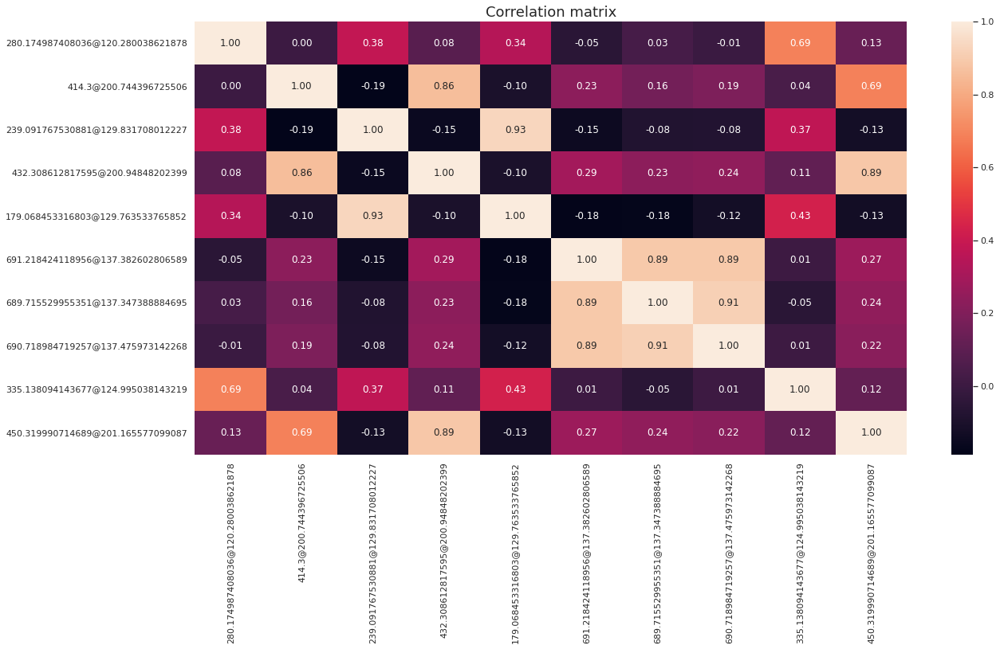

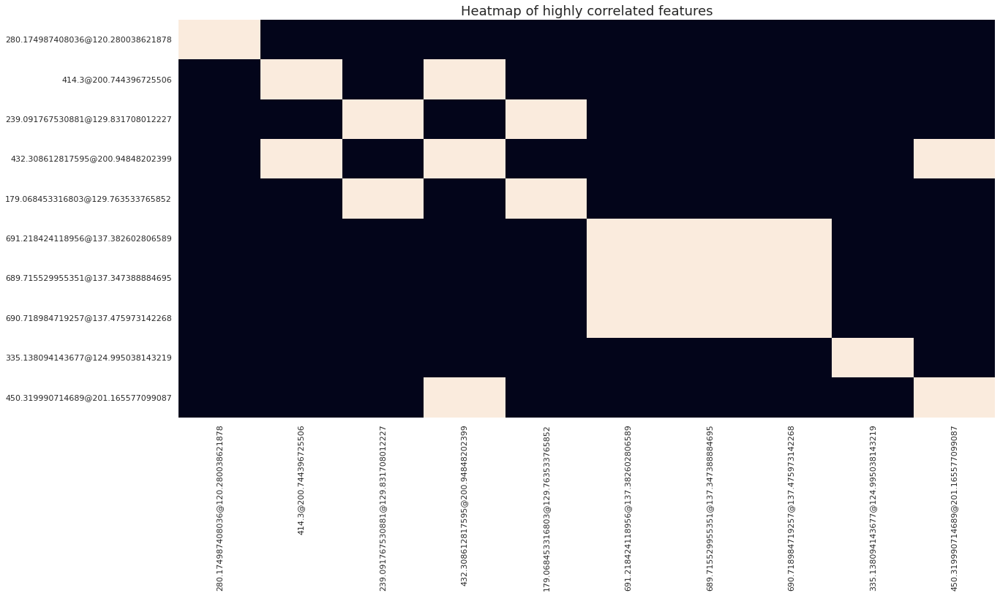



###################################################################################################################################################### 



In [50]:
matrix = pd.concat([target, X_imp_halfmin_log_std_fs_nb_10], axis=1)
plot_correlation_matrix(matrix, threshold=0.8, annot=True, fmt='.2f')

### Keeping 5 features

In [51]:
#target = 
matrix = X_imp_halfmin_log_std.copy()

X_imp_halfmin_log_std_fs_nb_5, feature_scores = select_best_features(matrix, target, k=5)
print(f'Initial number of dimension : {matrix.shape[1]}')
print(f'Final number of dimension : {feature_scores.shape[0]}')
display(feature_scores)
display(X_imp_halfmin_log_std_fs_nb_5)

Initial number of dimension : 1586
Final number of dimension : 5


,features,f_scores,p_values
424,280.174987408036@120.280038621878,29.147,0.0
752,414.3@200.744396725506,28.526,0.0
329,239.091767530881@129.831708012227,28.003,0.0
798,432.308612817595@200.94848202399,26.967,0.0
223,179.068453316803@129.763533765852,26.669,0.0


,280.174987408036@120.280038621878,414.3@200.744396725506,239.091767530881@129.831708012227,432.308612817595@200.94848202399,179.068453316803@129.763533765852
0,-0.462195,1.780826,-0.874797,1.030187,-1.006257
1,-0.423173,1.780139,-0.512157,1.584288,-0.645454
2,0.780324,2.283431,2.625411,2.162371,2.992665
3,0.695424,2.501720,2.575168,2.474072,2.946987
4,-1.189762,-0.484087,1.489742,-0.982767,1.772137
...,...,...,...,...,...
373,-0.422134,-0.256678,-0.704538,-0.124130,-0.260924
374,-0.911108,0.208441,-0.679036,0.104093,-0.088302
375,-0.839770,0.197326,-0.720899,0.037104,-0.017409
376,-0.281305,-0.786227,1.397879,0.342230,2.014561


######################################################################################################################################################


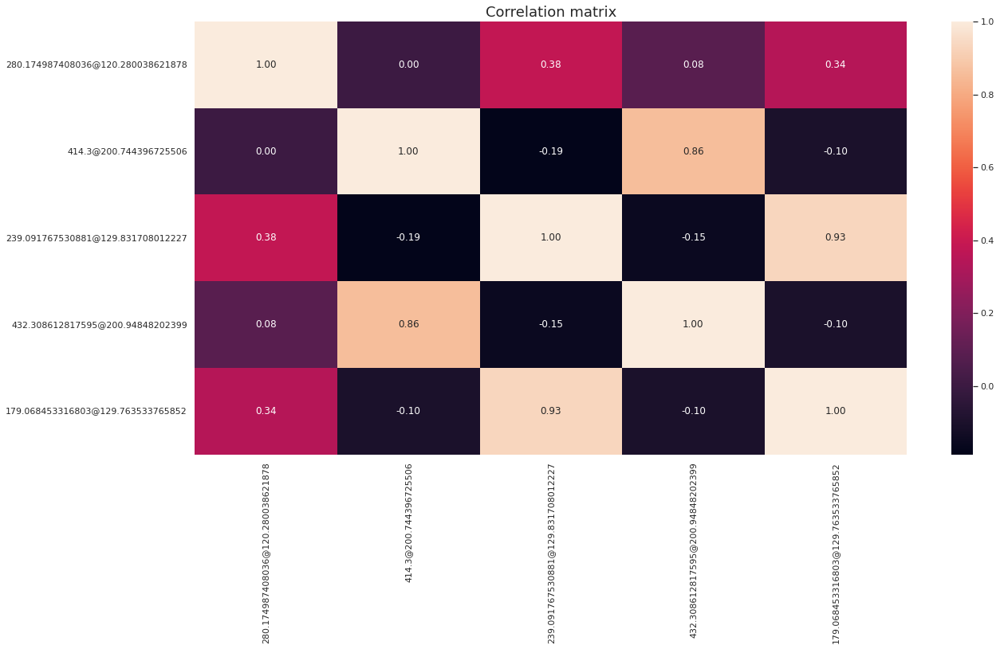

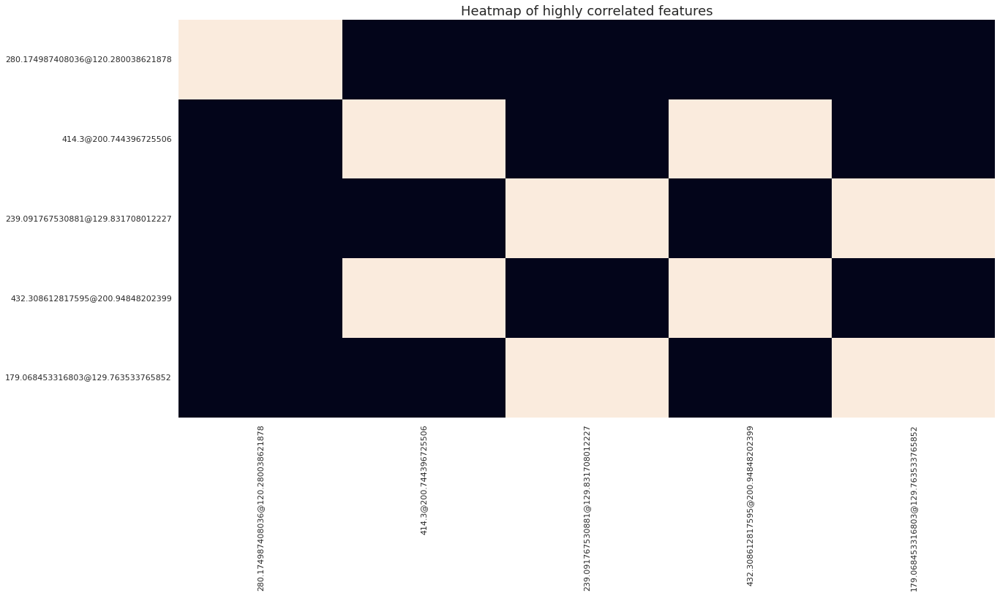



###################################################################################################################################################### 



In [52]:
matrix = pd.concat([target, X_imp_halfmin_log_std_fs_nb_5], axis=1)
plot_correlation_matrix(matrix, threshold=0.8, annot=True, fmt='.2f')

### Keeping 1 feature

In [53]:
#target = 
matrix = X_imp_halfmin_log_std.copy()

X_imp_halfmin_log_std_fs_nb_1, feature_scores = select_best_features(matrix, target, k=1)
print(f'Initial number of dimension : {matrix.shape[1]}')
print(f'Final number of dimension : {feature_scores.shape[0]}')
display(feature_scores)
display(X_imp_halfmin_log_std_fs_nb_1)

Initial number of dimension : 1586
Final number of dimension : 1


,features,f_scores,p_values
424,280.174987408036@120.280038621878,29.147,0.0


,280.174987408036@120.280038621878
0,-0.462195
1,-0.423173
2,0.780324
3,0.695424
4,-1.189762
...,...
373,-0.422134
374,-0.911108
375,-0.839770
376,-0.281305


#### For further analysis, we have the following reduced dataframes :
- <code>X_imp_halfmin_log_std_PCA</code> : reduced peak table with PCA keeping 95% of initial explained variance
- <code>X_imp_halfmin_log_std_PCA_tSNE</code> : reduced peak table with PCA as before + t-SNE reduction to keep only 2 components
- <code>X_imp_halfmin_log_std_fs_anova</code> : reduced peak table by keeping all features with ANOVA pvalue $\lt \alpha \hspace{0.39cm}$
- <code>X_imp_halfmin_std_fs_nb_N</code> : reduced peak table by keeping a specific number of features (with $N=\{1;5;10\}$ here)

# 6 - Classification

In [54]:
from classification_functions import *

In [55]:
from sklearn.linear_model import RidgeClassifier, LogisticRegression, SGDClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier, NearestCentroid
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.gaussian_process.kernels import RBF
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier, AdaBoostClassifier, GradientBoostingClassifier, HistGradientBoostingClassifier
from sklearn.neural_network import MLPClassifier

from sklearn.model_selection import LeaveOneOut

## a - Launch pipeline with differently preprocessed dataframes

In [56]:
# target = 

### with <code>X_imp_halfmin_log_std_PCA</code>

#################################################################-----------------###################################################################
################################################################| RidgeClassifier |##################################################################
#################################################################-----------------###################################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,47,5
HCC,16,8



Classification report :


,precision,recall,f1-score,support
CRR,0.75,0.90,0.82,52.00
HCC,0.62,0.33,0.43,24.00
accuracy,0.72,0.72,0.72,0.72
macro avg,0.68,0.62,0.62,76.00
weighted avg,0.70,0.72,0.70,76.00


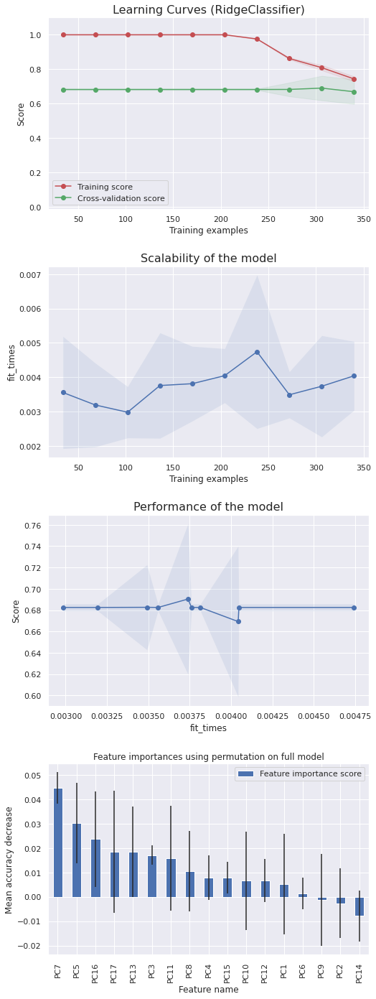




################################################################--------------------#################################################################
###############################################################| LogisticRegression |################################################################
################################################################--------------------#################################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,46,6
HCC,15,9



Classification report :


,precision,recall,f1-score,support
CRR,0.75,0.88,0.81,52.00
HCC,0.60,0.38,0.46,24.00
accuracy,0.72,0.72,0.72,0.72
macro avg,0.68,0.63,0.64,76.00
weighted avg,0.71,0.72,0.70,76.00


/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _c

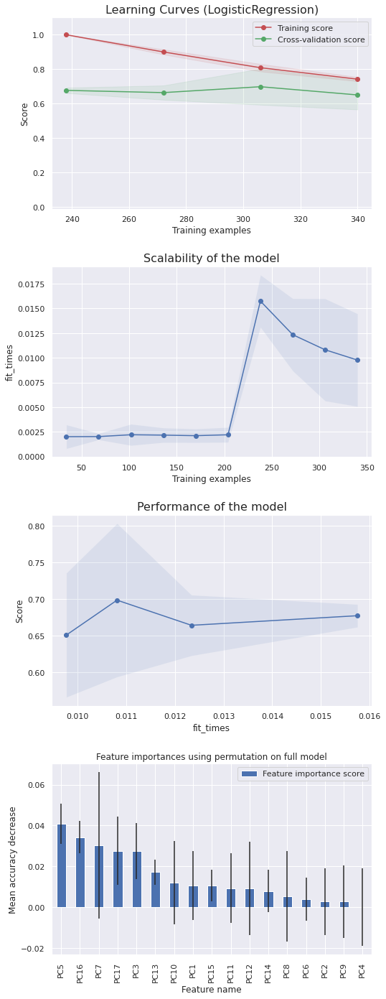




############################################################----------------------------#############################################################
###########################################################| LinearDiscriminantAnalysis |############################################################
############################################################----------------------------#############################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,46,6
HCC,16,8



Classification report :


,precision,recall,f1-score,support
CRR,0.74,0.88,0.81,52.00
HCC,0.57,0.33,0.42,24.00
accuracy,0.71,0.71,0.71,0.71
macro avg,0.66,0.61,0.61,76.00
weighted avg,0.69,0.71,0.69,76.00


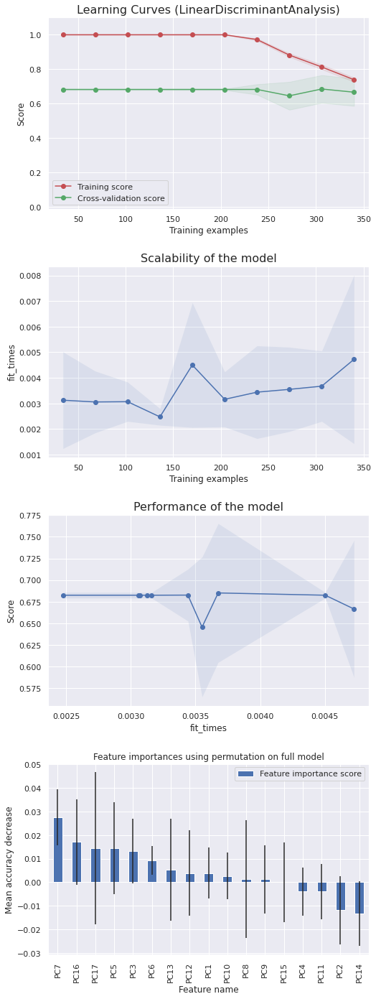




#######################################################################-----#########################################################################
######################################################################| SVC |########################################################################
#######################################################################-----#########################################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,50,2
HCC,18,6



Classification report :


,precision,recall,f1-score,support
CRR,0.74,0.96,0.83,52.00
HCC,0.75,0.25,0.38,24.00
accuracy,0.74,0.74,0.74,0.74
macro avg,0.74,0.61,0.60,76.00
weighted avg,0.74,0.74,0.69,76.00


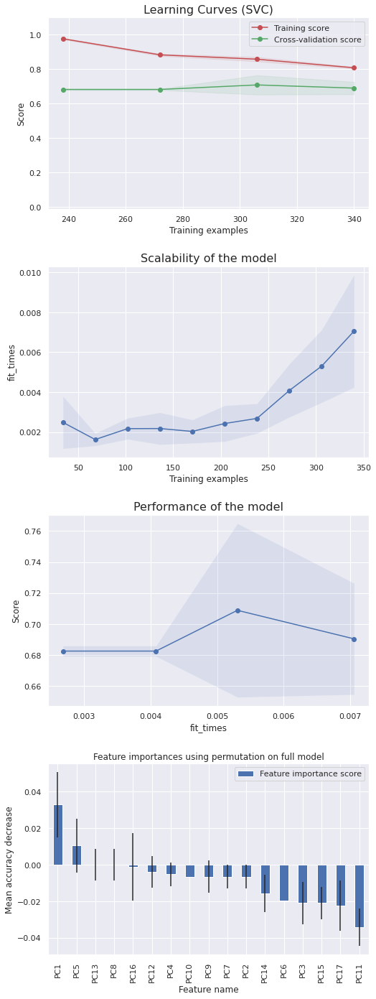




##################################################################---------------####################################################################
#################################################################| SGDClassifier |###################################################################
##################################################################---------------####################################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,41,11
HCC,15,9



Classification report :


,precision,recall,f1-score,support
CRR,0.73,0.79,0.76,52.00
HCC,0.45,0.38,0.41,24.00
accuracy,0.66,0.66,0.66,0.66
macro avg,0.59,0.58,0.58,76.00
weighted avg,0.64,0.66,0.65,76.00


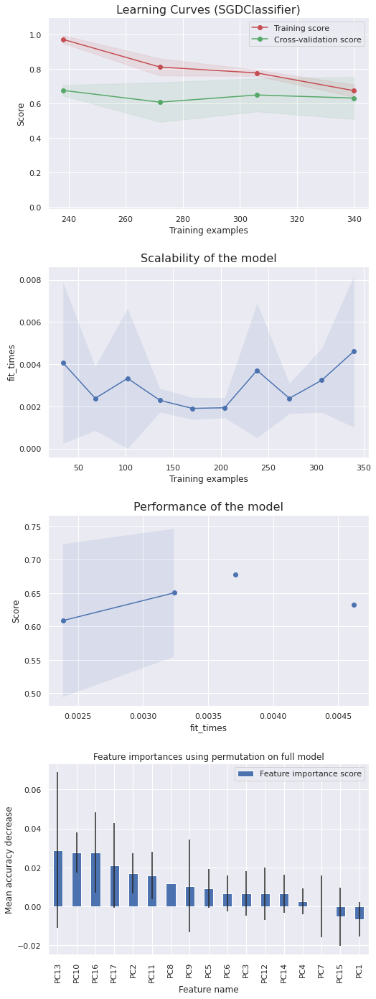




###############################################################----------------------################################################################
##############################################################| KNeighborsClassifier |###############################################################
###############################################################----------------------################################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,46,6
HCC,17,7



Classification report :


,precision,recall,f1-score,support
CRR,0.73,0.88,0.80,52.00
HCC,0.54,0.29,0.38,24.00
accuracy,0.70,0.70,0.70,0.70
macro avg,0.63,0.59,0.59,76.00
weighted avg,0.67,0.70,0.67,76.00


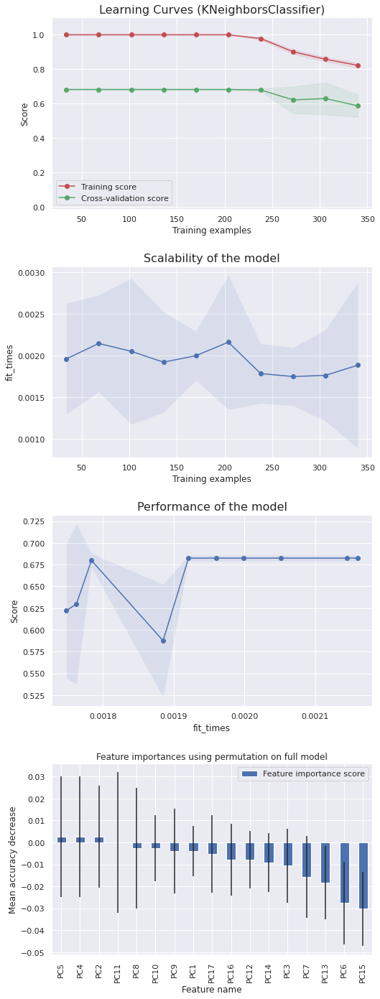




#################################################################-----------------###################################################################
################################################################| NearestCentroid |##################################################################
#################################################################-----------------###################################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,34,18
HCC,9,15



Classification report :


,precision,recall,f1-score,support
CRR,0.79,0.65,0.72,52.00
HCC,0.45,0.62,0.53,24.00
accuracy,0.64,0.64,0.64,0.64
macro avg,0.62,0.64,0.62,76.00
weighted avg,0.68,0.64,0.66,76.00


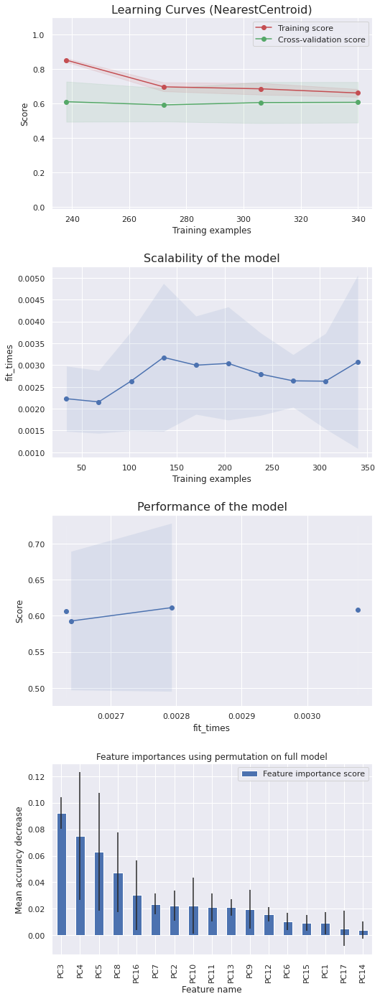




############################################################---------------------------##############################################################
###########################################################| GaussianProcessClassifier |#############################################################
############################################################---------------------------##############################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,51,1
HCC,12,12



Classification report :


,precision,recall,f1-score,support
CRR,0.81,0.98,0.89,52.00
HCC,0.92,0.50,0.65,24.00
accuracy,0.83,0.83,0.83,0.83
macro avg,0.87,0.74,0.77,76.00
weighted avg,0.85,0.83,0.81,76.00


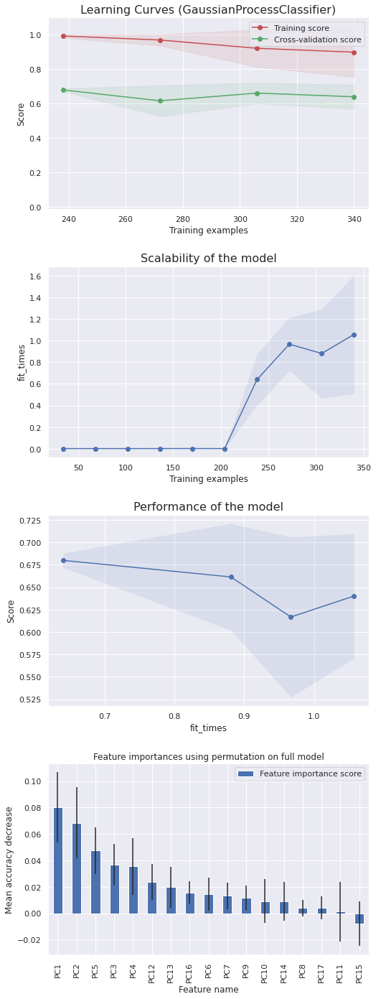




####################################################################------------#####################################################################
###################################################################| GaussianNB |####################################################################
####################################################################------------#####################################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,48,4
HCC,16,8



Classification report :


,precision,recall,f1-score,support
CRR,0.75,0.92,0.83,52.00
HCC,0.67,0.33,0.44,24.00
accuracy,0.74,0.74,0.74,0.74
macro avg,0.71,0.63,0.64,76.00
weighted avg,0.72,0.74,0.71,76.00


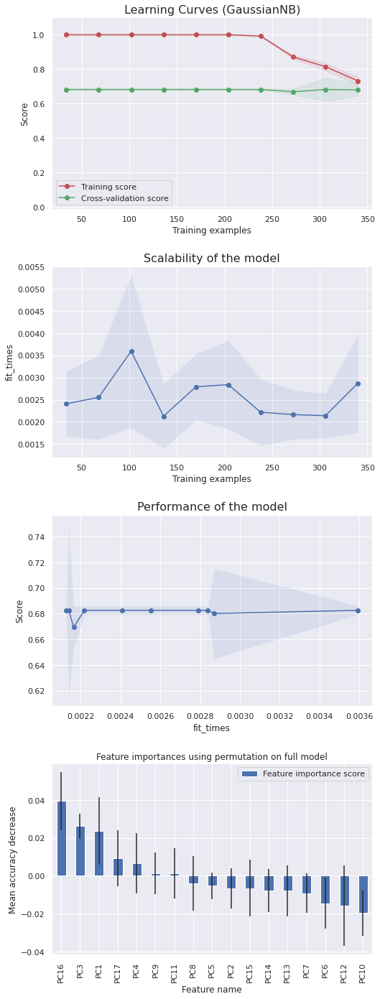




##############################################################------------------------###############################################################
#############################################################| DecisionTreeClassifier |##############################################################
##############################################################------------------------###############################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,44,8
HCC,14,10



Classification report :


,precision,recall,f1-score,support
CRR,0.76,0.85,0.80,52.00
HCC,0.56,0.42,0.48,24.00
accuracy,0.71,0.71,0.71,0.71
macro avg,0.66,0.63,0.64,76.00
weighted avg,0.69,0.71,0.70,76.00


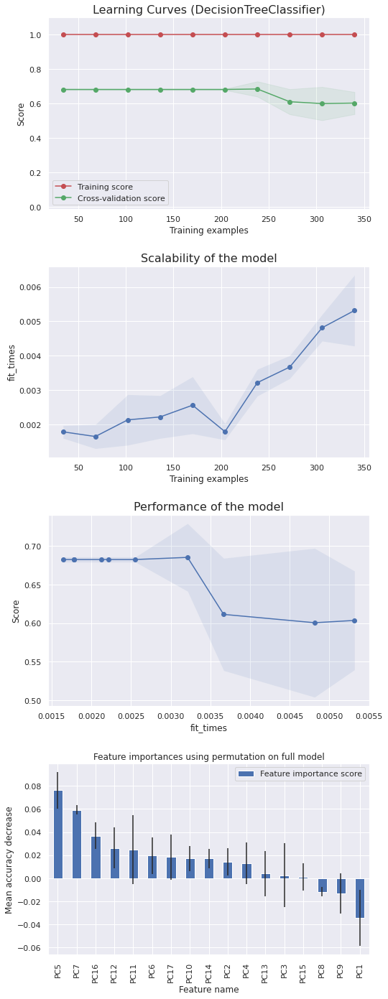




##############################################################------------------------###############################################################
#############################################################| RandomForestClassifier |##############################################################
##############################################################------------------------###############################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,50,2
HCC,11,13



Classification report :


,precision,recall,f1-score,support
CRR,0.82,0.96,0.88,52.00
HCC,0.87,0.54,0.67,24.00
accuracy,0.83,0.83,0.83,0.83
macro avg,0.84,0.75,0.78,76.00
weighted avg,0.83,0.83,0.82,76.00


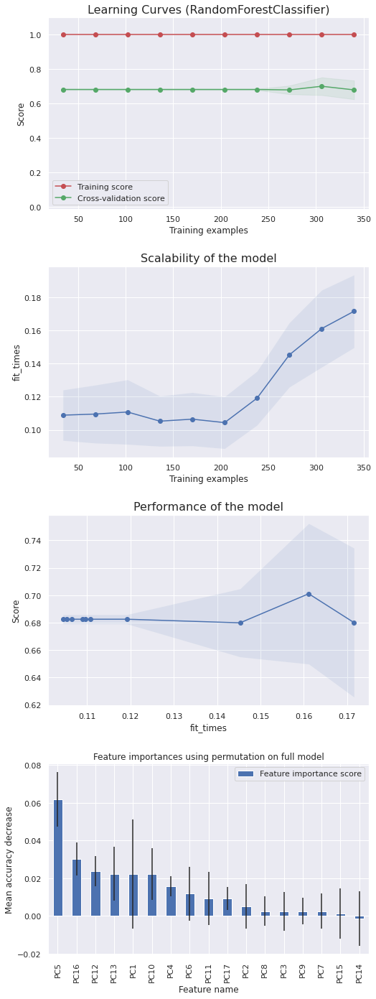




###############################################################----------------------################################################################
##############################################################| ExtraTreesClassifier |###############################################################
###############################################################----------------------################################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,51,1
HCC,10,14



Classification report :


,precision,recall,f1-score,support
CRR,0.84,0.98,0.90,52.00
HCC,0.93,0.58,0.72,24.00
accuracy,0.86,0.86,0.86,0.86
macro avg,0.88,0.78,0.81,76.00
weighted avg,0.87,0.86,0.84,76.00


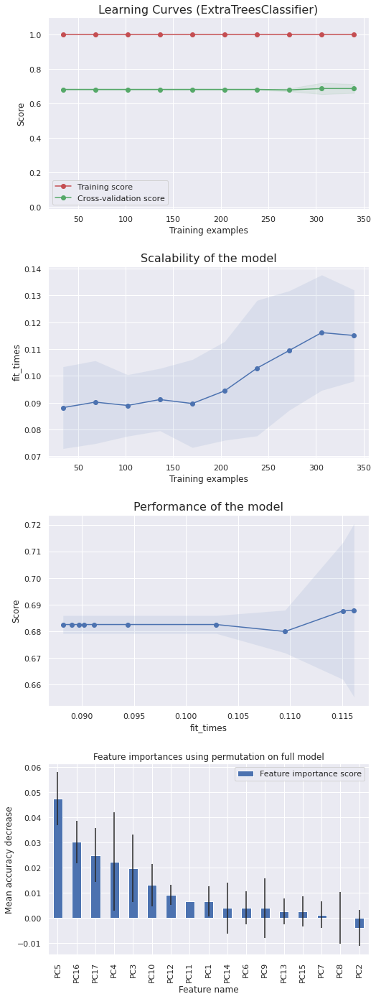




################################################################--------------------#################################################################
###############################################################| AdaBoostClassifier |################################################################
################################################################--------------------#################################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,40,12
HCC,14,10



Classification report :


,precision,recall,f1-score,support
CRR,0.74,0.77,0.75,52.00
HCC,0.45,0.42,0.43,24.00
accuracy,0.66,0.66,0.66,0.66
macro avg,0.60,0.59,0.59,76.00
weighted avg,0.65,0.66,0.65,76.00


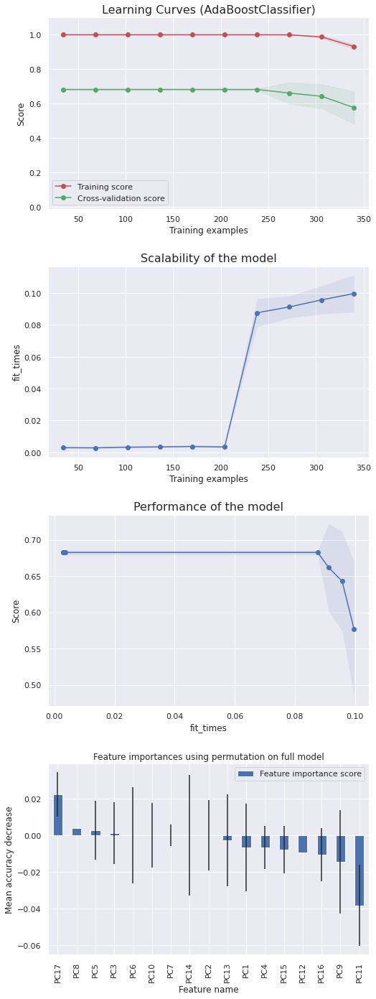




############################################################----------------------------#############################################################
###########################################################| GradientBoostingClassifier |############################################################
############################################################----------------------------#############################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,45,7
HCC,11,13



Classification report :


,precision,recall,f1-score,support
CRR,0.80,0.87,0.83,52.00
HCC,0.65,0.54,0.59,24.00
accuracy,0.76,0.76,0.76,0.76
macro avg,0.73,0.70,0.71,76.00
weighted avg,0.76,0.76,0.76,76.00


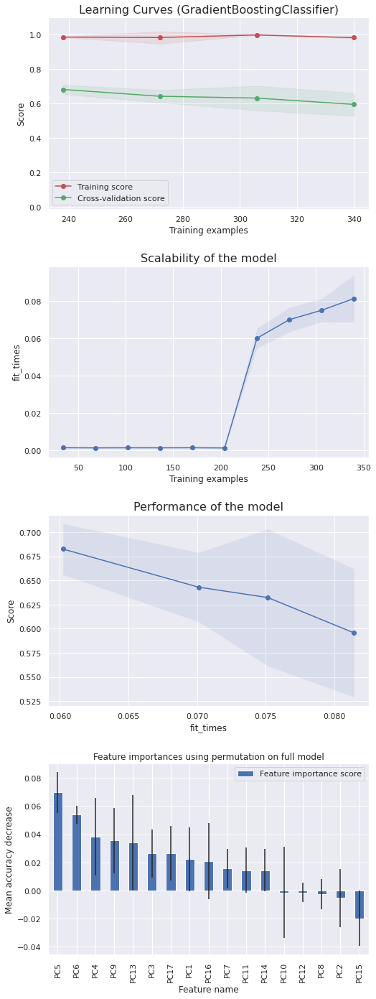




##########################################################--------------------------------###########################################################
#########################################################| HistGradientBoostingClassifier |##########################################################
##########################################################--------------------------------###########################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,49,3
HCC,8,16



Classification report :


,precision,recall,f1-score,support
CRR,0.86,0.94,0.90,52.00
HCC,0.84,0.67,0.74,24.00
accuracy,0.86,0.86,0.86,0.86
macro avg,0.85,0.80,0.82,76.00
weighted avg,0.85,0.86,0.85,76.00


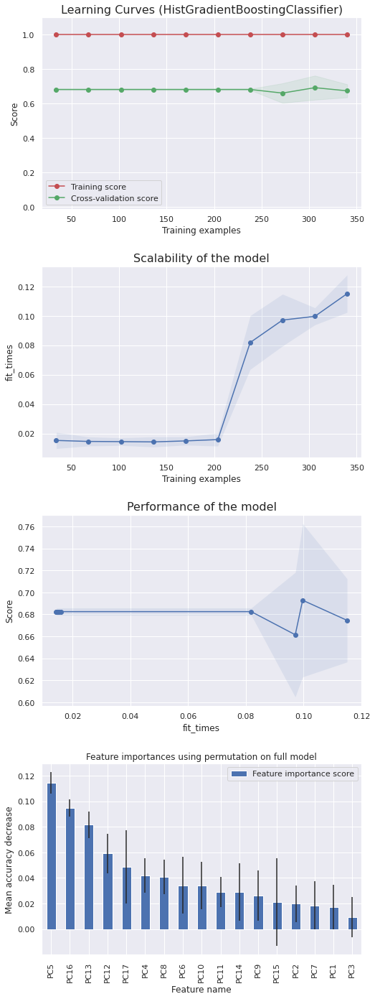




##################################################################---------------####################################################################
#################################################################| MLPClassifier |###################################################################
##################################################################---------------####################################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


/opt/conda/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:559: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html



,CRR,HCC
true/pred,,
CRR,39,13
HCC,10,14



Classification report :


,precision,recall,f1-score,support
CRR,0.80,0.75,0.77,52.00
HCC,0.52,0.58,0.55,24.00
accuracy,0.70,0.70,0.70,0.70
macro avg,0.66,0.67,0.66,76.00
weighted avg,0.71,0.70,0.70,76.00


/opt/conda/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:559: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/opt/conda/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:559: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/opt/conda/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:559: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS R

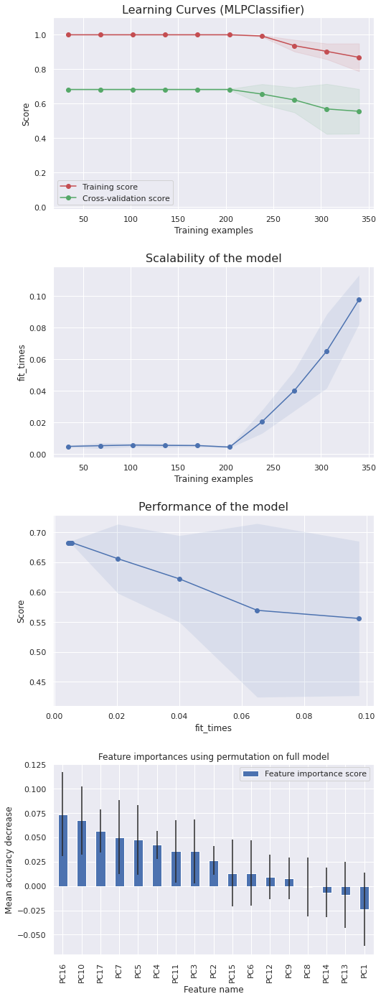




###################################################################################################################################################### 



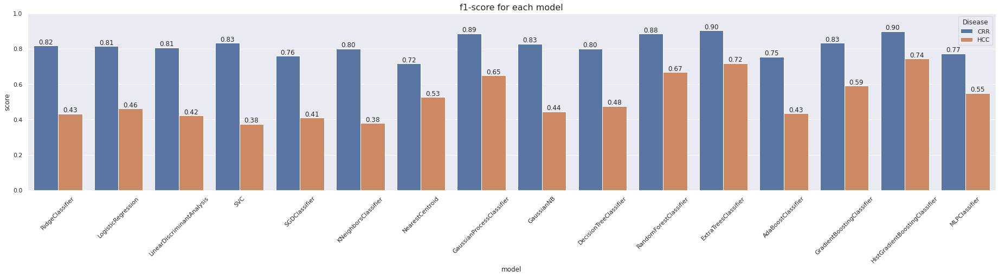


 ######################################################################################################################################################

Time to compute : 00h00m47s

 ######################################################################################################################################################






In [57]:
# Initialise models
RidgeClassifier_ = RidgeClassifier()
LogisticRegression_ = LogisticRegression()
LinearDiscriminantAnalysis_ = LinearDiscriminantAnalysis()
SVC_ = SVC(random_state=0)
SGDClassifier_ = SGDClassifier()
KNeighborsClassifier_ = KNeighborsClassifier()
NearestCentroid_ = NearestCentroid()
GaussianProcessClassifier_ = GaussianProcessClassifier(kernel=1.0 * RBF(1.0))
GaussianNB_ = GaussianNB()
DecisionTreeClassifier_ = DecisionTreeClassifier(random_state=0)
RandomForestClassifier_ = RandomForestClassifier(random_state=0)
ExtraTreesClassifier_ = ExtraTreesClassifier(random_state=0)
AdaBoostClassifier_ = AdaBoostClassifier(random_state=0)
GradientBoostingClassifier_ = GradientBoostingClassifier(n_estimators=100, learning_rate=1.0, max_depth=1, random_state=0)
HistGradientBoostingClassifier_ = HistGradientBoostingClassifier(max_iter=100)
MLPClassifier_ = MLPClassifier(solver='lbfgs', alpha=1e-5, hidden_layer_sizes=(5, 2), max_iter=300, random_state=1)


# Create dict with all models
dict_models = {'RidgeClassifier': RidgeClassifier_,
               'LogisticRegression': LogisticRegression_,
               'LinearDiscriminantAnalysis': LinearDiscriminantAnalysis_,
               'SVC': SVC_,
               'SGDClassifier': SGDClassifier_,
               'KNeighborsClassifier': KNeighborsClassifier_,
               'NearestCentroid': NearestCentroid_,
               'GaussianProcessClassifier': GaussianProcessClassifier_,
               'GaussianNB': GaussianNB_,
               'DecisionTreeClassifier': DecisionTreeClassifier_,
               'RandomForestClassifier': RandomForestClassifier_,
               'ExtraTreesClassifier': ExtraTreesClassifier_,
               'AdaBoostClassifier': AdaBoostClassifier_,
               'GradientBoostingClassifier': GradientBoostingClassifier_,
               'HistGradientBoostingClassifier': HistGradientBoostingClassifier_,
               'MLPClassifier': MLPClassifier_
              }

# Launch classification pipeline
df_scores, dict_df_feature_importance = pipeline_classification(X=X_imp_halfmin_log_std_PCA, y=target,
                                                                dict_models=dict_models, plot_each_model=True, plot_hist_score=True,
                                                                score='f1-score', cv=10, train_size=0.7, test_size=0.3)

In [58]:
print()

### with <code>X_imp_halfmin_log_std_fs_nb_10</code>

#################################################################-----------------###################################################################
################################################################| RidgeClassifier |##################################################################
#################################################################-----------------###################################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,48,4
HCC,18,6



Classification report :


,precision,recall,f1-score,support
CRR,0.73,0.92,0.81,52.00
HCC,0.60,0.25,0.35,24.00
accuracy,0.71,0.71,0.71,0.71
macro avg,0.66,0.59,0.58,76.00
weighted avg,0.69,0.71,0.67,76.00


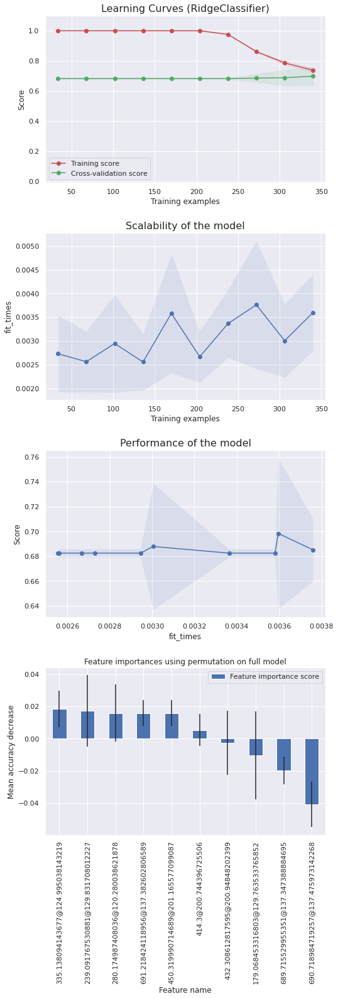




################################################################--------------------#################################################################
###############################################################| LogisticRegression |################################################################
################################################################--------------------#################################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,48,4
HCC,17,7



Classification report :


,precision,recall,f1-score,support
CRR,0.74,0.92,0.82,52.00
HCC,0.64,0.29,0.40,24.00
accuracy,0.72,0.72,0.72,0.72
macro avg,0.69,0.61,0.61,76.00
weighted avg,0.71,0.72,0.69,76.00


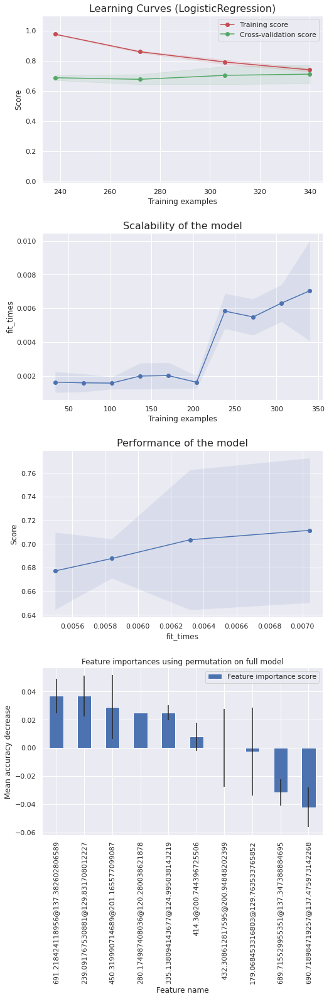




############################################################----------------------------#############################################################
###########################################################| LinearDiscriminantAnalysis |############################################################
############################################################----------------------------#############################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,48,4
HCC,17,7



Classification report :


,precision,recall,f1-score,support
CRR,0.74,0.92,0.82,52.00
HCC,0.64,0.29,0.40,24.00
accuracy,0.72,0.72,0.72,0.72
macro avg,0.69,0.61,0.61,76.00
weighted avg,0.71,0.72,0.69,76.00


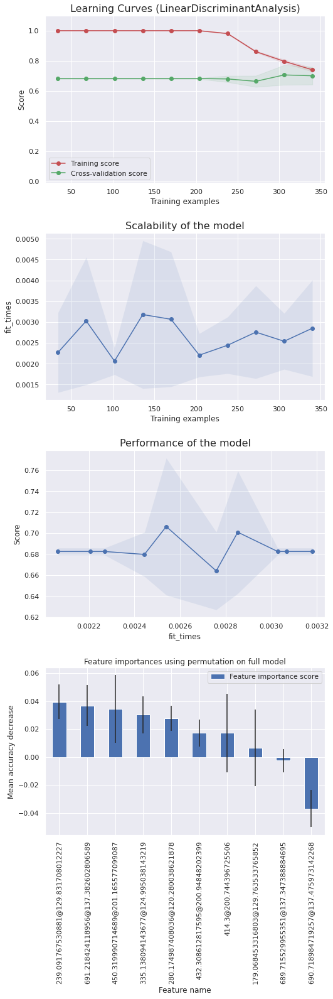




#######################################################################-----#########################################################################
######################################################################| SVC |########################################################################
#######################################################################-----#########################################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,48,4
HCC,18,6



Classification report :


,precision,recall,f1-score,support
CRR,0.73,0.92,0.81,52.00
HCC,0.60,0.25,0.35,24.00
accuracy,0.71,0.71,0.71,0.71
macro avg,0.66,0.59,0.58,76.00
weighted avg,0.69,0.71,0.67,76.00


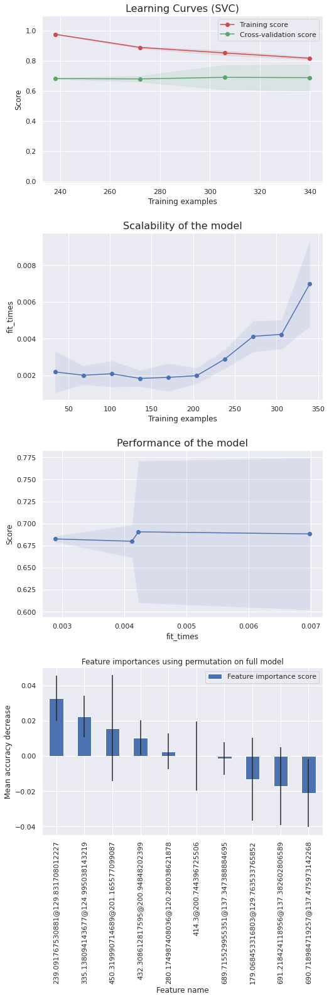




##################################################################---------------####################################################################
#################################################################| SGDClassifier |###################################################################
##################################################################---------------####################################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,36,16
HCC,10,14



Classification report :


,precision,recall,f1-score,support
CRR,0.78,0.69,0.73,52.00
HCC,0.47,0.58,0.52,24.00
accuracy,0.66,0.66,0.66,0.66
macro avg,0.62,0.64,0.63,76.00
weighted avg,0.68,0.66,0.67,76.00


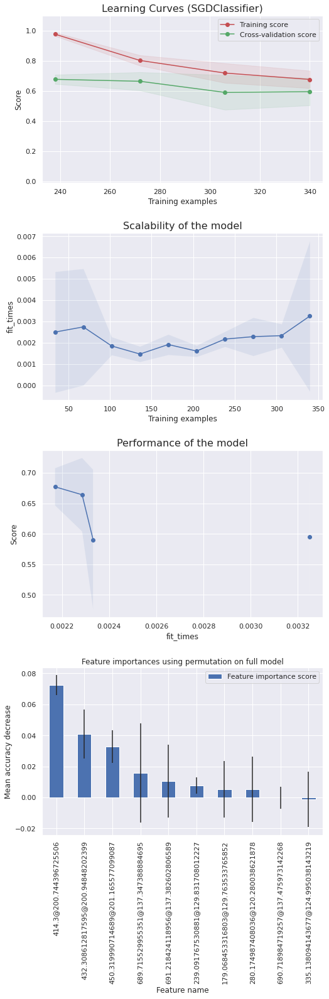




###############################################################----------------------################################################################
##############################################################| KNeighborsClassifier |###############################################################
###############################################################----------------------################################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,49,3
HCC,17,7



Classification report :


,precision,recall,f1-score,support
CRR,0.74,0.94,0.83,52.00
HCC,0.70,0.29,0.41,24.00
accuracy,0.74,0.74,0.74,0.74
macro avg,0.72,0.62,0.62,76.00
weighted avg,0.73,0.74,0.70,76.00


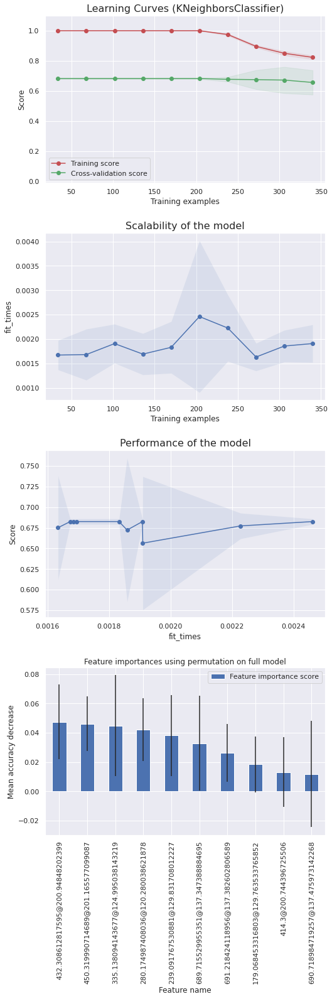




#################################################################-----------------###################################################################
################################################################| NearestCentroid |##################################################################
#################################################################-----------------###################################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,40,12
HCC,8,16



Classification report :


,precision,recall,f1-score,support
CRR,0.83,0.77,0.80,52.00
HCC,0.57,0.67,0.62,24.00
accuracy,0.74,0.74,0.74,0.74
macro avg,0.70,0.72,0.71,76.00
weighted avg,0.75,0.74,0.74,76.00


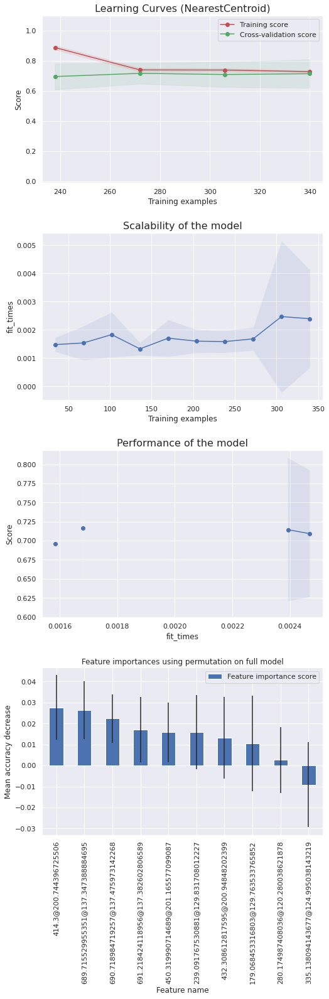




############################################################---------------------------##############################################################
###########################################################| GaussianProcessClassifier |#############################################################
############################################################---------------------------##############################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,46,6
HCC,15,9



Classification report :


,precision,recall,f1-score,support
CRR,0.75,0.88,0.81,52.00
HCC,0.60,0.38,0.46,24.00
accuracy,0.72,0.72,0.72,0.72
macro avg,0.68,0.63,0.64,76.00
weighted avg,0.71,0.72,0.70,76.00


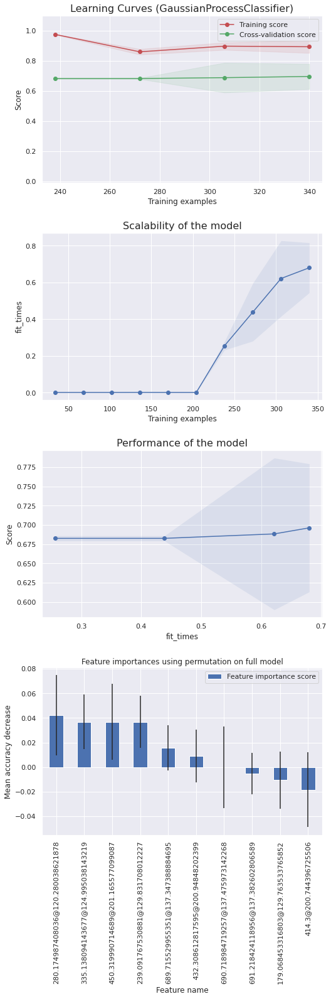




####################################################################------------#####################################################################
###################################################################| GaussianNB |####################################################################
####################################################################------------#####################################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,48,4
HCC,15,9



Classification report :


,precision,recall,f1-score,support
CRR,0.76,0.92,0.83,52.00
HCC,0.69,0.38,0.49,24.00
accuracy,0.75,0.75,0.75,0.75
macro avg,0.73,0.65,0.66,76.00
weighted avg,0.74,0.75,0.72,76.00


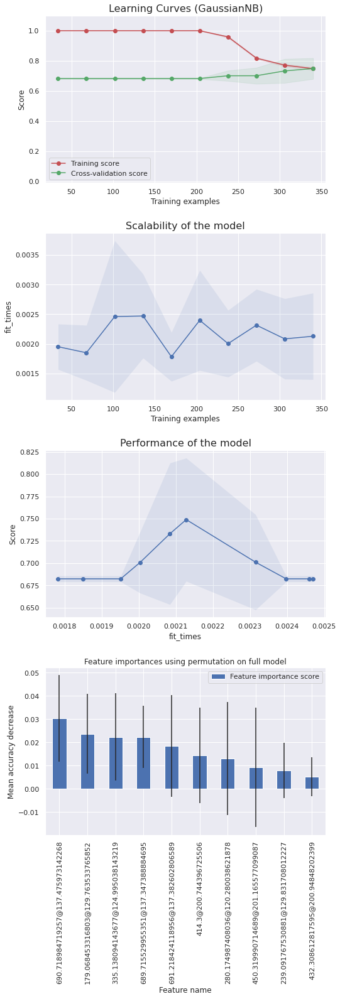




##############################################################------------------------###############################################################
#############################################################| DecisionTreeClassifier |##############################################################
##############################################################------------------------###############################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,44,8
HCC,11,13



Classification report :


,precision,recall,f1-score,support
CRR,0.80,0.85,0.82,52.00
HCC,0.62,0.54,0.58,24.00
accuracy,0.75,0.75,0.75,0.75
macro avg,0.71,0.69,0.70,76.00
weighted avg,0.74,0.75,0.75,76.00


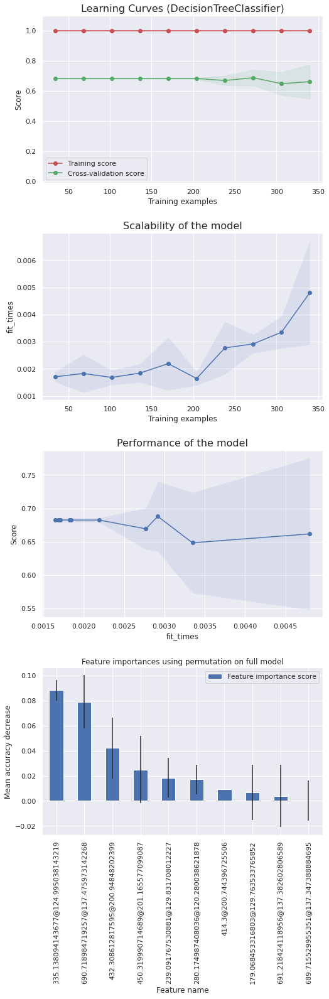




##############################################################------------------------###############################################################
#############################################################| RandomForestClassifier |##############################################################
##############################################################------------------------###############################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,50,2
HCC,12,12



Classification report :


,precision,recall,f1-score,support
CRR,0.81,0.96,0.88,52.00
HCC,0.86,0.50,0.63,24.00
accuracy,0.82,0.82,0.82,0.82
macro avg,0.83,0.73,0.75,76.00
weighted avg,0.82,0.82,0.80,76.00


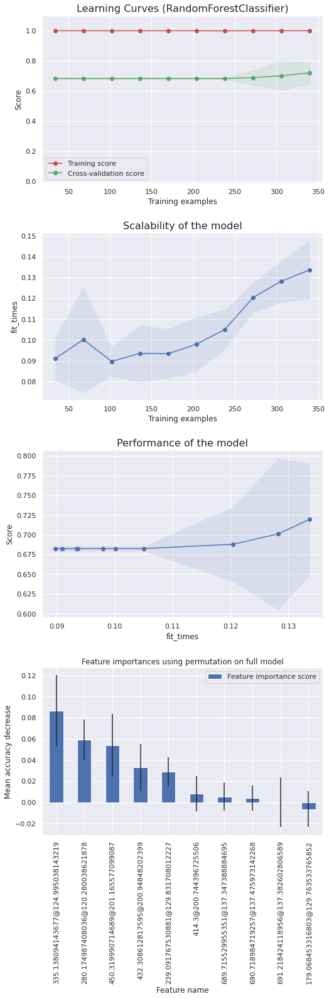




###############################################################----------------------################################################################
##############################################################| ExtraTreesClassifier |###############################################################
###############################################################----------------------################################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,52,0
HCC,11,13



Classification report :


,precision,recall,f1-score,support
CRR,0.83,1.00,0.90,52.00
HCC,1.00,0.54,0.70,24.00
accuracy,0.86,0.86,0.86,0.86
macro avg,0.91,0.77,0.80,76.00
weighted avg,0.88,0.86,0.84,76.00


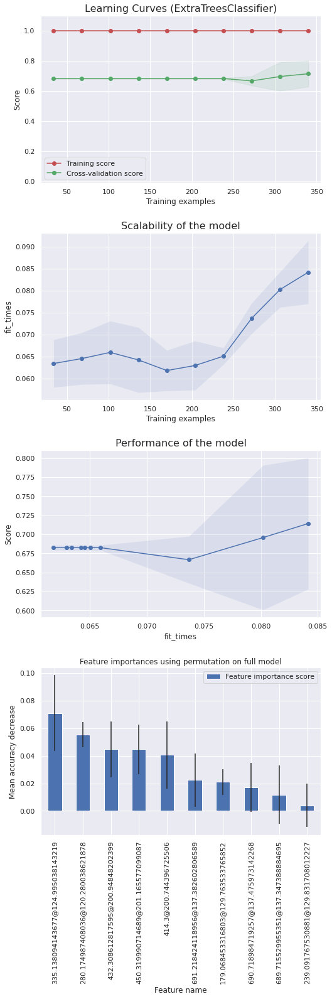




################################################################--------------------#################################################################
###############################################################| AdaBoostClassifier |################################################################
################################################################--------------------#################################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,47,5
HCC,14,10



Classification report :


,precision,recall,f1-score,support
CRR,0.77,0.90,0.83,52.00
HCC,0.67,0.42,0.51,24.00
accuracy,0.75,0.75,0.75,0.75
macro avg,0.72,0.66,0.67,76.00
weighted avg,0.74,0.75,0.73,76.00


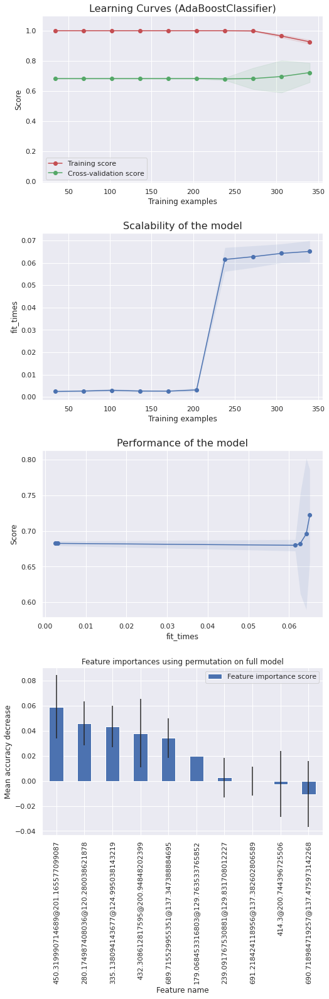




############################################################----------------------------#############################################################
###########################################################| GradientBoostingClassifier |############################################################
############################################################----------------------------#############################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,45,7
HCC,12,12



Classification report :


,precision,recall,f1-score,support
CRR,0.79,0.87,0.83,52.00
HCC,0.63,0.50,0.56,24.00
accuracy,0.75,0.75,0.75,0.75
macro avg,0.71,0.68,0.69,76.00
weighted avg,0.74,0.75,0.74,76.00


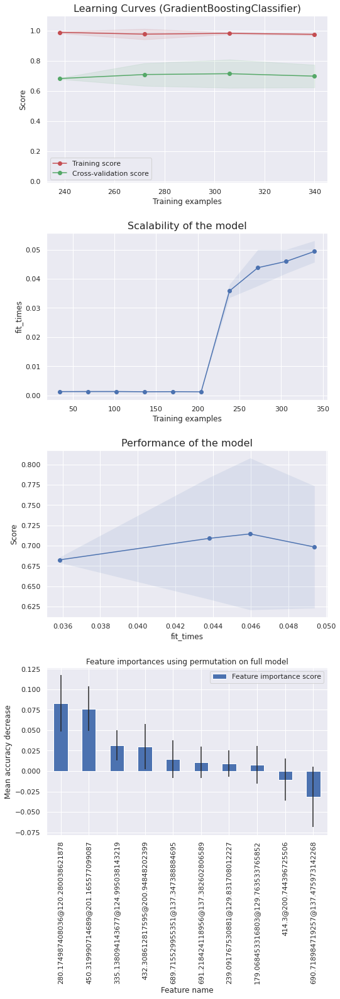




##########################################################--------------------------------###########################################################
#########################################################| HistGradientBoostingClassifier |##########################################################
##########################################################--------------------------------###########################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,48,4
HCC,10,14



Classification report :


,precision,recall,f1-score,support
CRR,0.83,0.92,0.87,52.00
HCC,0.78,0.58,0.67,24.00
accuracy,0.82,0.82,0.82,0.82
macro avg,0.80,0.75,0.77,76.00
weighted avg,0.81,0.82,0.81,76.00


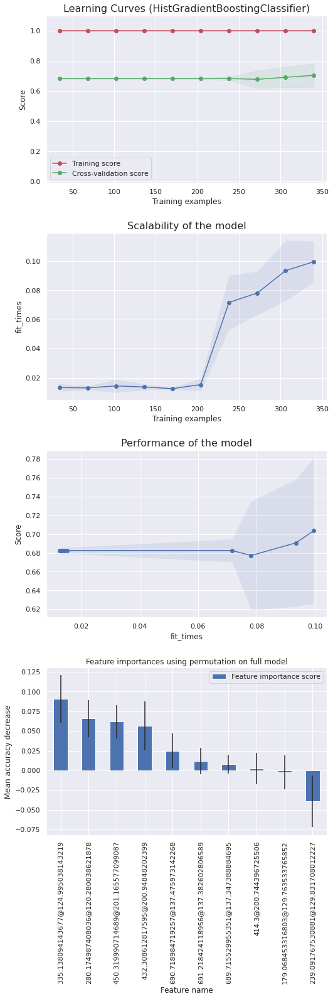




##################################################################---------------####################################################################
#################################################################| MLPClassifier |###################################################################
##################################################################---------------####################################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,32,20
HCC,6,18



Classification report :


,precision,recall,f1-score,support
CRR,0.84,0.62,0.71,52.00
HCC,0.47,0.75,0.58,24.00
accuracy,0.66,0.66,0.66,0.66
macro avg,0.66,0.68,0.65,76.00
weighted avg,0.73,0.66,0.67,76.00


/opt/conda/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:559: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/opt/conda/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:559: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/opt/conda/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:559: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS R

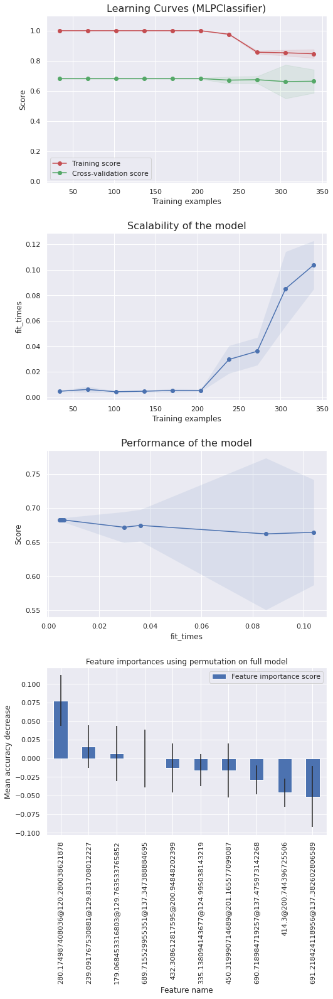




###################################################################################################################################################### 



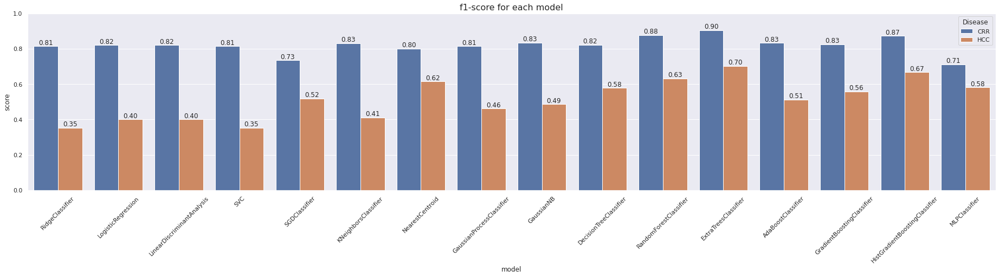


 ######################################################################################################################################################

Time to compute : 00h00m33s

 ######################################################################################################################################################






In [59]:
# Initialise models
RidgeClassifier_ = RidgeClassifier()
LogisticRegression_ = LogisticRegression()
LinearDiscriminantAnalysis_ = LinearDiscriminantAnalysis()
SVC_ = SVC(random_state=0)
SGDClassifier_ = SGDClassifier()
KNeighborsClassifier_ = KNeighborsClassifier()
NearestCentroid_ = NearestCentroid()
GaussianProcessClassifier_ = GaussianProcessClassifier(kernel=1.0 * RBF(1.0))
GaussianNB_ = GaussianNB()
DecisionTreeClassifier_ = DecisionTreeClassifier(random_state=0)
RandomForestClassifier_ = RandomForestClassifier(random_state=0)
ExtraTreesClassifier_ = ExtraTreesClassifier(random_state=0)
AdaBoostClassifier_ = AdaBoostClassifier(random_state=0)
GradientBoostingClassifier_ = GradientBoostingClassifier(n_estimators=100, learning_rate=1.0, max_depth=1, random_state=0)
HistGradientBoostingClassifier_ = HistGradientBoostingClassifier(max_iter=100)
MLPClassifier_ = MLPClassifier(solver='lbfgs', alpha=1e-5, hidden_layer_sizes=(5, 2), max_iter=300, random_state=1)


# Create dict with all models
dict_models = {'RidgeClassifier': RidgeClassifier_,
               'LogisticRegression': LogisticRegression_,
               'LinearDiscriminantAnalysis': LinearDiscriminantAnalysis_,
               'SVC': SVC_,
               'SGDClassifier': SGDClassifier_,
               'KNeighborsClassifier': KNeighborsClassifier_,
               'NearestCentroid': NearestCentroid_,
               'GaussianProcessClassifier': GaussianProcessClassifier_,
               'GaussianNB': GaussianNB_,
               'DecisionTreeClassifier': DecisionTreeClassifier_,
               'RandomForestClassifier': RandomForestClassifier_,
               'ExtraTreesClassifier': ExtraTreesClassifier_,
               'AdaBoostClassifier': AdaBoostClassifier_,
               'GradientBoostingClassifier': GradientBoostingClassifier_,
               'HistGradientBoostingClassifier': HistGradientBoostingClassifier_,
               'MLPClassifier': MLPClassifier_
              }


# Launch classification pipeline
df_scores, dict_df_feature_importance = pipeline_classification(X=X_imp_halfmin_log_std_fs_nb_10, y=target,
                                                                dict_models=dict_models, plot_each_model=True, plot_hist_score=True,
                                                                score='f1-score', cv=10, train_size=0.7, test_size=0.3)

In [60]:
print()

### with <code>X_imp_halfmin_log_std_fs_nb_5</code>

#################################################################-----------------###################################################################
################################################################| RidgeClassifier |##################################################################
#################################################################-----------------###################################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,49,3
HCC,17,7



Classification report :


,precision,recall,f1-score,support
CRR,0.74,0.94,0.83,52.00
HCC,0.70,0.29,0.41,24.00
accuracy,0.74,0.74,0.74,0.74
macro avg,0.72,0.62,0.62,76.00
weighted avg,0.73,0.74,0.70,76.00


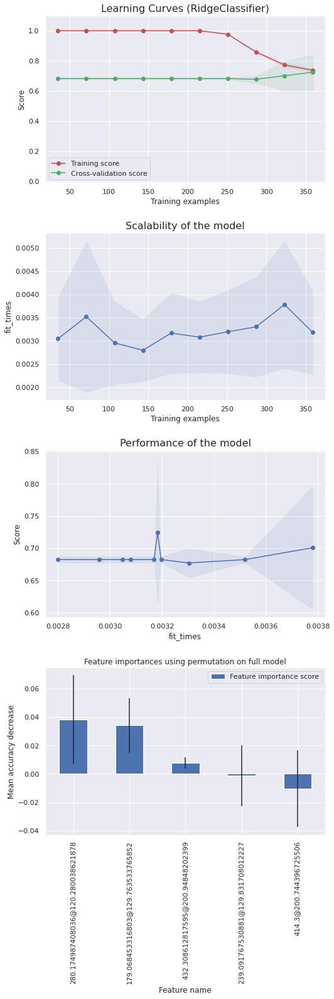




################################################################--------------------#################################################################
###############################################################| LogisticRegression |################################################################
################################################################--------------------#################################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,49,3
HCC,17,7



Classification report :


,precision,recall,f1-score,support
CRR,0.74,0.94,0.83,52.00
HCC,0.70,0.29,0.41,24.00
accuracy,0.74,0.74,0.74,0.74
macro avg,0.72,0.62,0.62,76.00
weighted avg,0.73,0.74,0.70,76.00


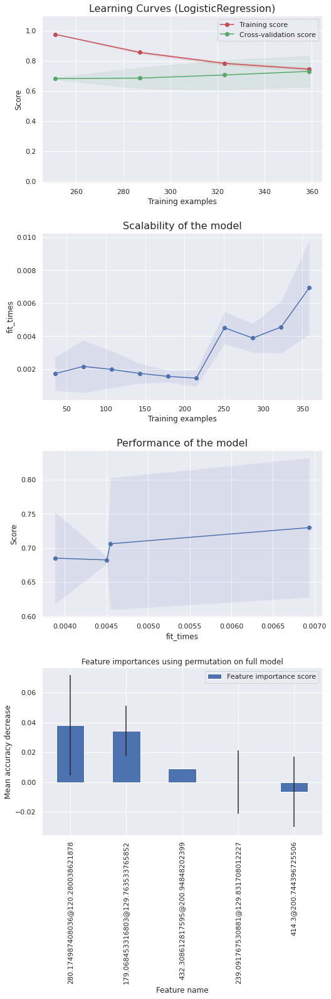




############################################################----------------------------#############################################################
###########################################################| LinearDiscriminantAnalysis |############################################################
############################################################----------------------------#############################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,49,3
HCC,16,8



Classification report :


,precision,recall,f1-score,support
CRR,0.75,0.94,0.84,52.00
HCC,0.73,0.33,0.46,24.00
accuracy,0.75,0.75,0.75,0.75
macro avg,0.74,0.64,0.65,76.00
weighted avg,0.75,0.75,0.72,76.00


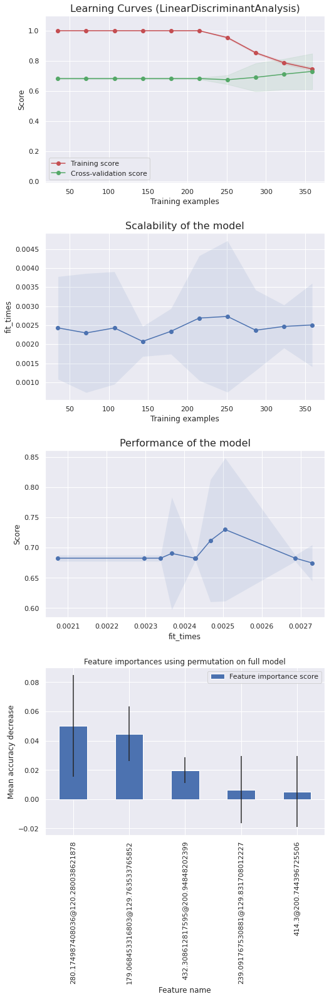




#######################################################################-----#########################################################################
######################################################################| SVC |########################################################################
#######################################################################-----#########################################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,49,3
HCC,19,5



Classification report :


,precision,recall,f1-score,support
CRR,0.72,0.94,0.82,52.00
HCC,0.62,0.21,0.31,24.00
accuracy,0.71,0.71,0.71,0.71
macro avg,0.67,0.58,0.56,76.00
weighted avg,0.69,0.71,0.66,76.00


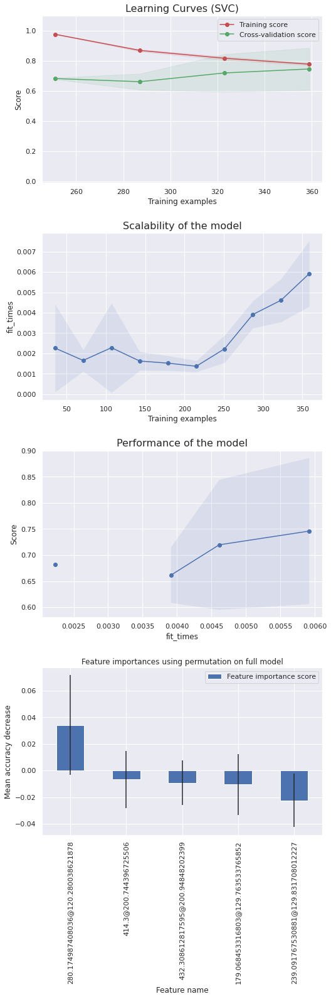




##################################################################---------------####################################################################
#################################################################| SGDClassifier |###################################################################
##################################################################---------------####################################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,42,10
HCC,23,1



Classification report :


,precision,recall,f1-score,support
CRR,0.65,0.81,0.72,52.00
HCC,0.09,0.04,0.06,24.00
accuracy,0.57,0.57,0.57,0.57
macro avg,0.37,0.42,0.39,76.00
weighted avg,0.47,0.57,0.51,76.00


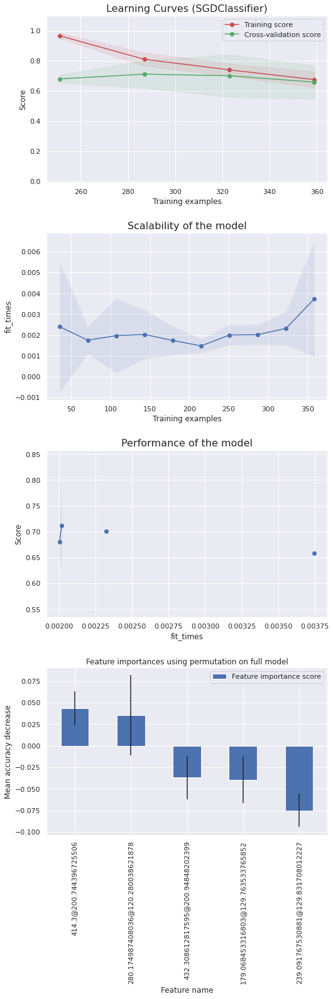




###############################################################----------------------################################################################
##############################################################| KNeighborsClassifier |###############################################################
###############################################################----------------------################################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,45,7
HCC,16,8



Classification report :


,precision,recall,f1-score,support
CRR,0.74,0.87,0.80,52.00
HCC,0.53,0.33,0.41,24.00
accuracy,0.70,0.70,0.70,0.70
macro avg,0.64,0.60,0.60,76.00
weighted avg,0.67,0.70,0.67,76.00


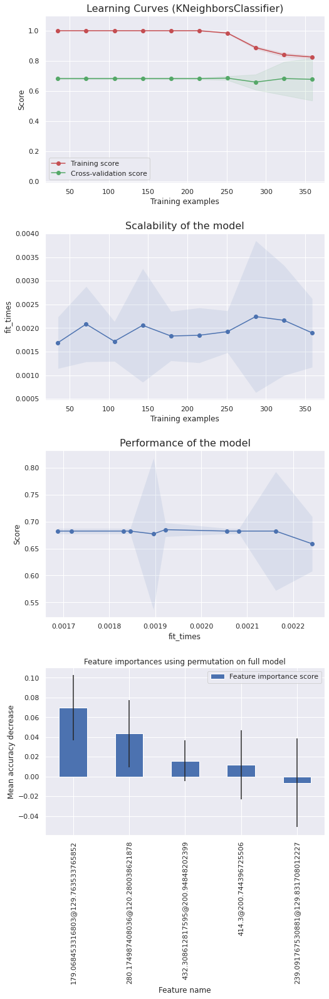




#################################################################-----------------###################################################################
################################################################| NearestCentroid |##################################################################
#################################################################-----------------###################################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,39,13
HCC,8,16



Classification report :


,precision,recall,f1-score,support
CRR,0.83,0.75,0.79,52.00
HCC,0.55,0.67,0.60,24.00
accuracy,0.72,0.72,0.72,0.72
macro avg,0.69,0.71,0.70,76.00
weighted avg,0.74,0.72,0.73,76.00


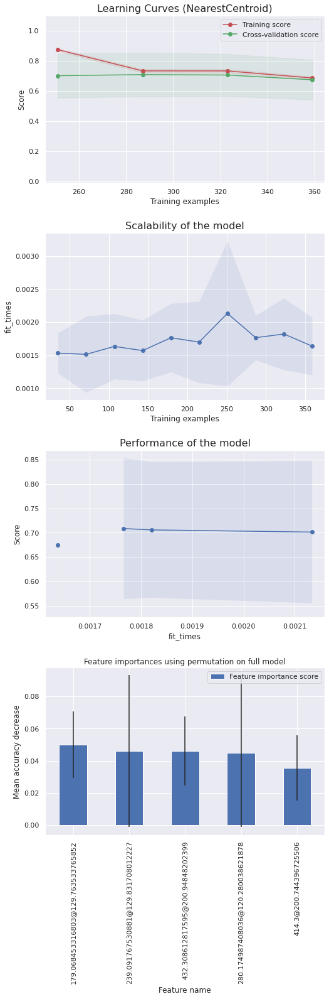




############################################################---------------------------##############################################################
###########################################################| GaussianProcessClassifier |#############################################################
############################################################---------------------------##############################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,46,6
HCC,18,6



Classification report :


,precision,recall,f1-score,support
CRR,0.72,0.88,0.79,52.00
HCC,0.50,0.25,0.33,24.00
accuracy,0.68,0.68,0.68,0.68
macro avg,0.61,0.57,0.56,76.00
weighted avg,0.65,0.68,0.65,76.00


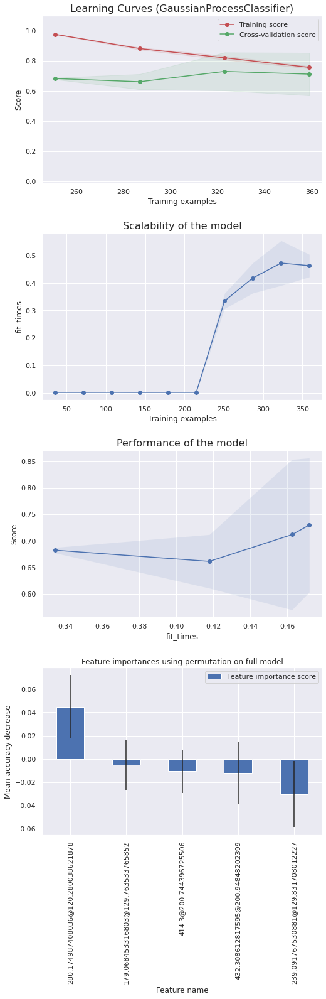




####################################################################------------#####################################################################
###################################################################| GaussianNB |####################################################################
####################################################################------------#####################################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,47,5
HCC,16,8



Classification report :


,precision,recall,f1-score,support
CRR,0.75,0.90,0.82,52.00
HCC,0.62,0.33,0.43,24.00
accuracy,0.72,0.72,0.72,0.72
macro avg,0.68,0.62,0.62,76.00
weighted avg,0.70,0.72,0.70,76.00


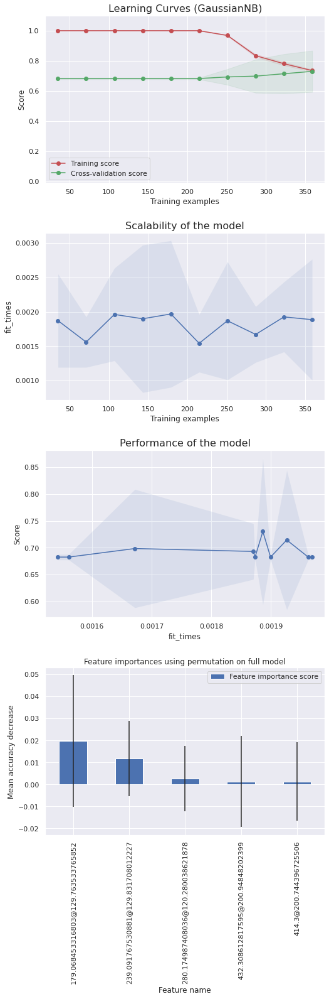




##############################################################------------------------###############################################################
#############################################################| DecisionTreeClassifier |##############################################################
##############################################################------------------------###############################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,43,9
HCC,12,12



Classification report :


,precision,recall,f1-score,support
CRR,0.78,0.83,0.80,52.00
HCC,0.57,0.50,0.53,24.00
accuracy,0.72,0.72,0.72,0.72
macro avg,0.68,0.66,0.67,76.00
weighted avg,0.72,0.72,0.72,76.00


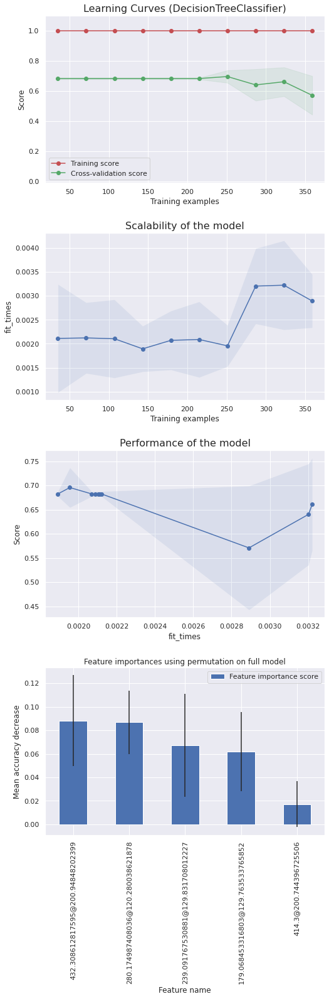




##############################################################------------------------###############################################################
#############################################################| RandomForestClassifier |##############################################################
##############################################################------------------------###############################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,48,4
HCC,16,8



Classification report :


,precision,recall,f1-score,support
CRR,0.75,0.92,0.83,52.00
HCC,0.67,0.33,0.44,24.00
accuracy,0.74,0.74,0.74,0.74
macro avg,0.71,0.63,0.64,76.00
weighted avg,0.72,0.74,0.71,76.00


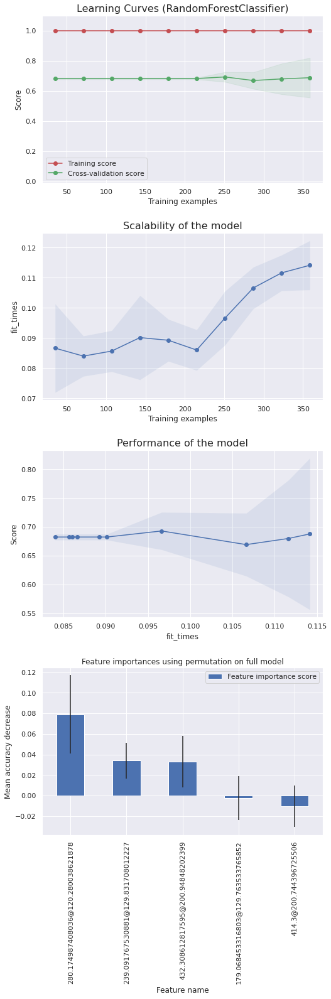




###############################################################----------------------################################################################
##############################################################| ExtraTreesClassifier |###############################################################
###############################################################----------------------################################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,51,1
HCC,14,10



Classification report :


,precision,recall,f1-score,support
CRR,0.78,0.98,0.87,52.00
HCC,0.91,0.42,0.57,24.00
accuracy,0.80,0.80,0.80,0.80
macro avg,0.85,0.70,0.72,76.00
weighted avg,0.82,0.80,0.78,76.00


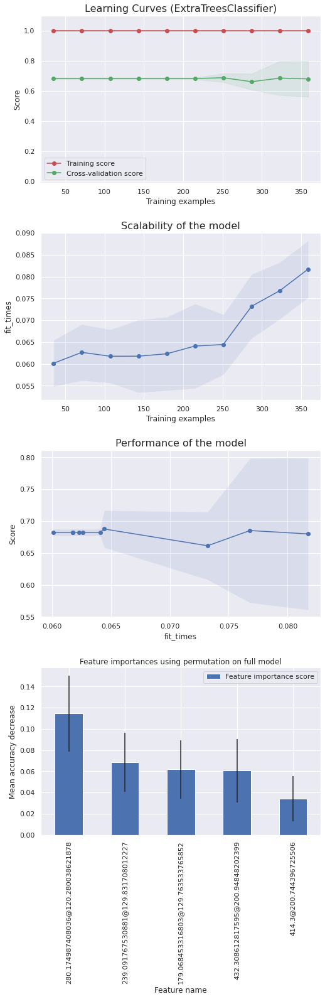




################################################################--------------------#################################################################
###############################################################| AdaBoostClassifier |################################################################
################################################################--------------------#################################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,41,11
HCC,17,7



Classification report :


,precision,recall,f1-score,support
CRR,0.71,0.79,0.75,52.00
HCC,0.39,0.29,0.33,24.00
accuracy,0.63,0.63,0.63,0.63
macro avg,0.55,0.54,0.54,76.00
weighted avg,0.61,0.63,0.62,76.00


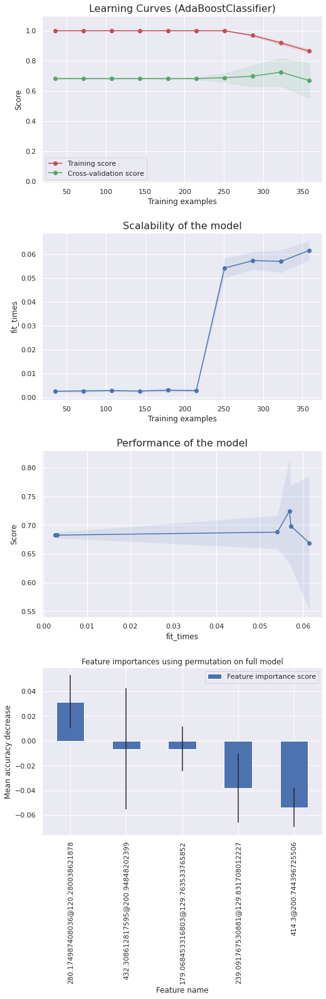




############################################################----------------------------#############################################################
###########################################################| GradientBoostingClassifier |############################################################
############################################################----------------------------#############################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,42,10
HCC,18,6



Classification report :


,precision,recall,f1-score,support
CRR,0.70,0.81,0.75,52.00
HCC,0.38,0.25,0.30,24.00
accuracy,0.63,0.63,0.63,0.63
macro avg,0.54,0.53,0.53,76.00
weighted avg,0.60,0.63,0.61,76.00


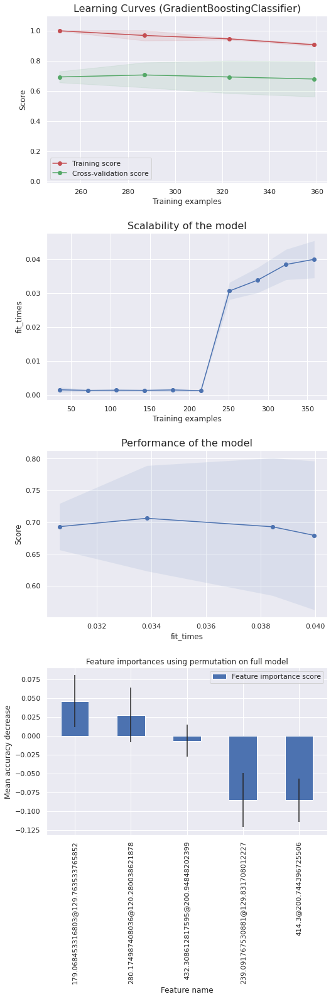




##########################################################--------------------------------###########################################################
#########################################################| HistGradientBoostingClassifier |##########################################################
##########################################################--------------------------------###########################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,47,5
HCC,16,8



Classification report :


,precision,recall,f1-score,support
CRR,0.75,0.90,0.82,52.00
HCC,0.62,0.33,0.43,24.00
accuracy,0.72,0.72,0.72,0.72
macro avg,0.68,0.62,0.62,76.00
weighted avg,0.70,0.72,0.70,76.00


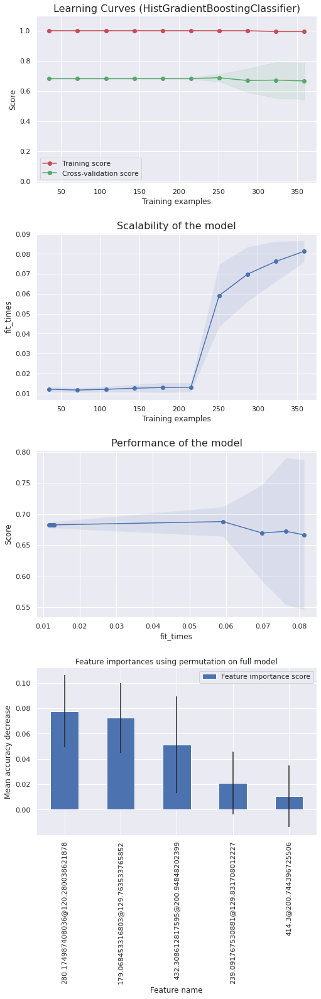




##################################################################---------------####################################################################
#################################################################| MLPClassifier |###################################################################
##################################################################---------------####################################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,49,3
HCC,17,7



Classification report :


,precision,recall,f1-score,support
CRR,0.74,0.94,0.83,52.00
HCC,0.70,0.29,0.41,24.00
accuracy,0.74,0.74,0.74,0.74
macro avg,0.72,0.62,0.62,76.00
weighted avg,0.73,0.74,0.70,76.00


/opt/conda/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:559: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/opt/conda/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:559: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/opt/conda/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:559: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS R

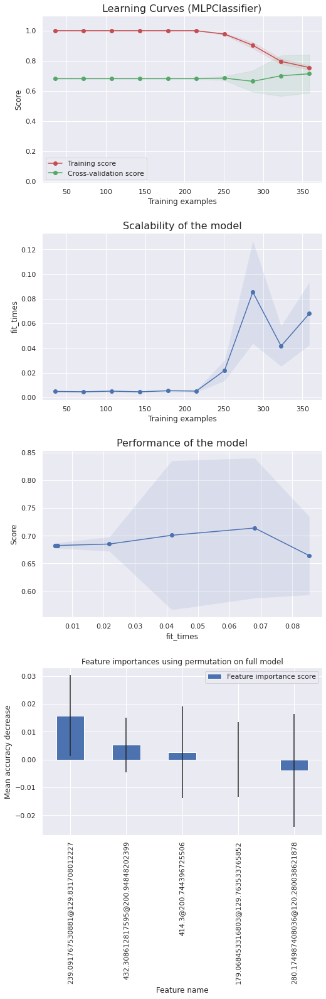




###################################################################################################################################################### 



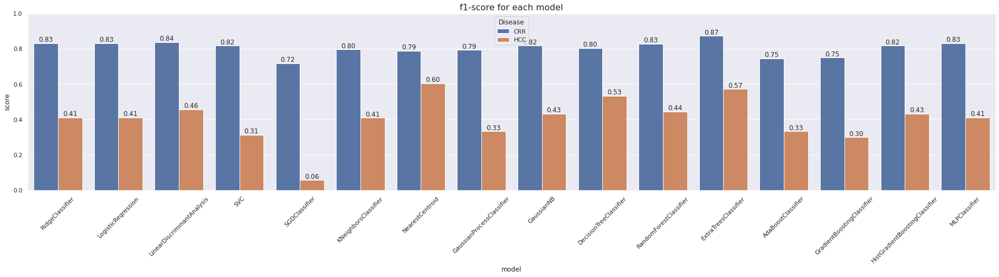


 ######################################################################################################################################################

Time to compute : 00h00m41s

 ######################################################################################################################################################






In [61]:
# Initialise models
RidgeClassifier_ = RidgeClassifier()
LogisticRegression_ = LogisticRegression()
LinearDiscriminantAnalysis_ = LinearDiscriminantAnalysis()
SVC_ = SVC(random_state=0)
SGDClassifier_ = SGDClassifier()
KNeighborsClassifier_ = KNeighborsClassifier()
NearestCentroid_ = NearestCentroid()
GaussianProcessClassifier_ = GaussianProcessClassifier(kernel=1.0 * RBF(1.0))
GaussianNB_ = GaussianNB()
DecisionTreeClassifier_ = DecisionTreeClassifier(random_state=0)
RandomForestClassifier_ = RandomForestClassifier(random_state=0)
ExtraTreesClassifier_ = ExtraTreesClassifier(random_state=0)
AdaBoostClassifier_ = AdaBoostClassifier(random_state=0)
GradientBoostingClassifier_ = GradientBoostingClassifier(n_estimators=100, learning_rate=1.0, max_depth=1, random_state=0)
HistGradientBoostingClassifier_ = HistGradientBoostingClassifier(max_iter=100)
MLPClassifier_ = MLPClassifier(solver='lbfgs', alpha=1e-5, hidden_layer_sizes=(5, 2), max_iter=300, random_state=1)


# Create dict with all models
dict_models = {'RidgeClassifier': RidgeClassifier_,
               'LogisticRegression': LogisticRegression_,
               'LinearDiscriminantAnalysis': LinearDiscriminantAnalysis_,
               'SVC': SVC_,
               'SGDClassifier': SGDClassifier_,
               'KNeighborsClassifier': KNeighborsClassifier_,
               'NearestCentroid': NearestCentroid_,
               'GaussianProcessClassifier': GaussianProcessClassifier_,
               'GaussianNB': GaussianNB_,
               'DecisionTreeClassifier': DecisionTreeClassifier_,
               'RandomForestClassifier': RandomForestClassifier_,
               'ExtraTreesClassifier': ExtraTreesClassifier_,
               'AdaBoostClassifier': AdaBoostClassifier_,
               'GradientBoostingClassifier': GradientBoostingClassifier_,
               'HistGradientBoostingClassifier': HistGradientBoostingClassifier_,
               'MLPClassifier': MLPClassifier_
              }


# Launch classification pipeline
df_scores, dict_df_feature_importance = pipeline_classification(X=X_imp_halfmin_log_std_fs_nb_5, y=target,
                                                                dict_models=dict_models, plot_each_model=True, plot_hist_score=True,
                                                                score='f1-score', cv=20, train_size=0.7, test_size=0.3)

In [62]:
print()

#### On the above barplot, we can choose a model and dig into its caracteristics, e.g. *RandomForestClassifier*

In [63]:
df_scores

,RidgeClassifier,LogisticRegression,LinearDiscriminantAnalysis,SVC,SGDClassifier,KNeighborsClassifier,NearestCentroid,GaussianProcessClassifier,GaussianNB,DecisionTreeClassifier,RandomForestClassifier,ExtraTreesClassifier,AdaBoostClassifier,GradientBoostingClassifier,HistGradientBoostingClassifier,MLPClassifier
CRR,0.83,0.83,0.84,0.82,0.72,0.80,0.79,0.79,0.82,0.80,0.83,0.87,0.75,0.75,0.82,0.83
HCC,0.41,0.41,0.46,0.31,0.06,0.41,0.60,0.33,0.43,0.53,0.44,0.57,0.33,0.30,0.43,0.41


In [64]:
dict_df_feature_importance['RandomForestClassifier']

,Feature name,Feature importance score
0,280.174987408036@120.280038621878,0.08
2,239.091767530881@129.831708012227,0.03
3,432.308612817595@200.94848202399,0.03
4,179.068453316803@129.763533765852,-0.00
1,414.3@200.744396725506,-0.01


In [65]:
print()

#### We can then dig into the dictionary file of metadata to check to which biological compounds corresponds the feature names above !

# 7 - Clustering

In [66]:
from clustering_functions import *

In [67]:
# target = 

## a - Kmeans

/opt/conda/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning:

X does not have valid feature names, but KMeans was fitted with feature names



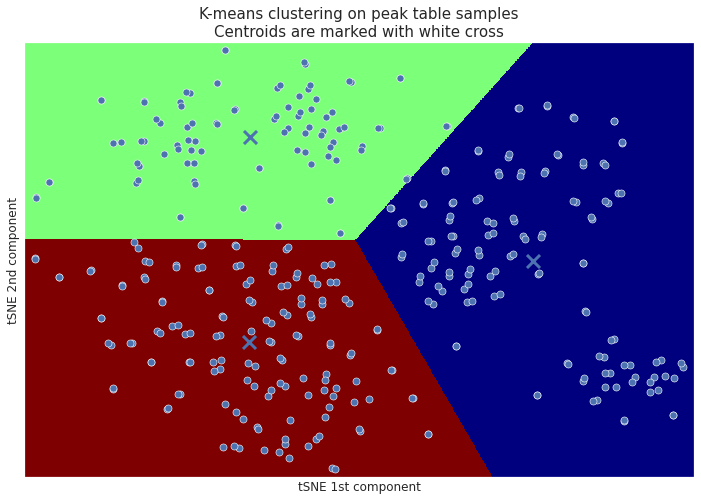

Inertia of k-means model : 50682.75


In [68]:
kmeans = perform_kmeans(X_imp_halfmin_log_std_PCA_tSNE.astype('double'), n_clusters=3, col_prefix='tSNE')

## b - Affinity propagation

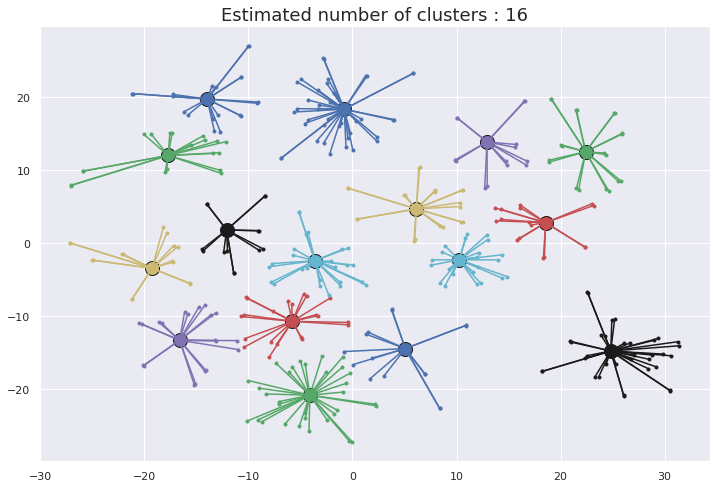

In [69]:
af = perform_affinity_propagation(X_imp_halfmin_log_std_PCA_tSNE)

## c - Hierarchical clustering

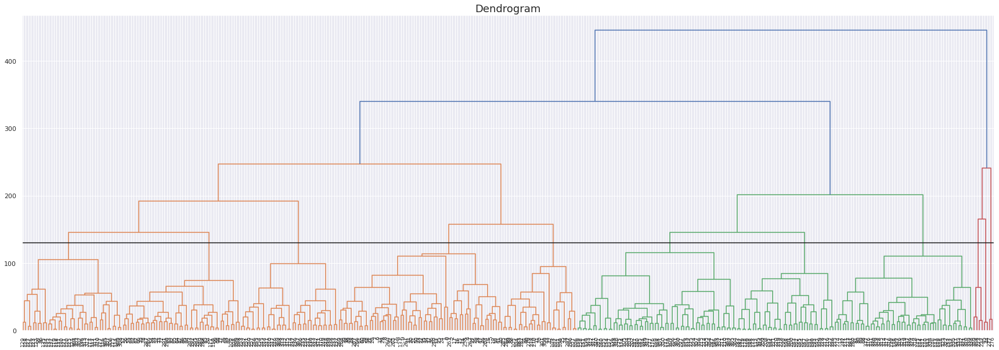

In [72]:
plot_dendrogram(X_imp_halfmin_log_std_PCA, hline=130)

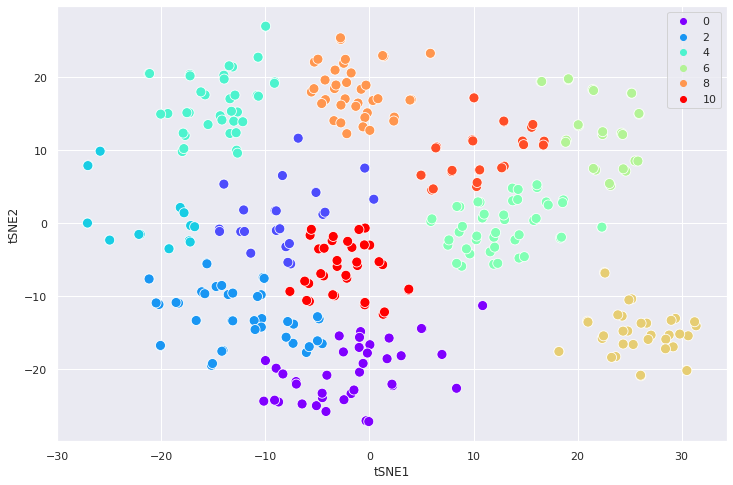

In [76]:
hc = perform_hierarchical_clustering(X_imp_halfmin_log_std_PCA_tSNE, n_clusters=11)